DBSCAN - Density Based Spatial Clustering of Applications with Noise

- Number of clusters doesn't need to be specified
- Finding arbitrary-shaped clusters
- Noise points detection ( outliers )

In [129]:
import numpy as np
import matplotlib.pyplot as plt
import hdbscan
from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.cluster import DBSCAN as SklearnDBSCAN
from sklearn.cluster import OPTICS
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import silhouette_score
import heapq

In [130]:
class CustomDBSCAN:
    def __init__(self, eps=0.5, min_samples=5):
        self.eps = eps
        self.min_samples = min_samples

    def fit(self, X):
        self.X = np.asarray(X)
        n_samples = len(X)
        self.labels_ = -np.ones(n_samples)  # -1 will be used for noise
        self.visited = np.zeros(n_samples, dtype=bool)  #tracks visited points
        self.cluster_id = 0

        #Build a KD-tree for distance calculation
        self.neighbors = NearestNeighbors(radius=self.eps)
        self.neighbors.fit(X)

        for point_idx in range(n_samples):
            if self.visited[point_idx]:
                continue
            self.visited[point_idx] = True
            #Find neighbors of the point within epsilon
            neighbors = self._region_query(point_idx)
            if len(neighbors) < self.min_samples:
                #Mark as noise if not enough neighbors
                self.labels_[point_idx] = -1
            else:
                #Start a new cluster
                self._expand_cluster(point_idx, neighbors)

        return self

    def _region_query(self, point_idx):
        distances, indices = self.neighbors.radius_neighbors(self.X[point_idx].reshape(1, -1), radius=self.eps)
        return indices[0]

    def _expand_cluster(self, point_idx, neighbors):
        self.labels_[point_idx] = self.cluster_id
        seeds = neighbors.copy()

        #Remove the current point from its own neighbors by excluding it from seeds
        seeds = seeds[seeds != point_idx]

        while len(seeds) > 0:
            current_point = seeds[0]
            if not self.visited[current_point]:
                self.visited[current_point] = True
                new_neighbors = self._region_query(current_point)
                if len(new_neighbors) >= self.min_samples:
                    seeds = np.concatenate([seeds, new_neighbors])  #Adds new neighbors to the seed list

            if self.labels_[current_point] == -1:
                self.labels_[current_point] = self.cluster_id
            seeds = seeds[seeds != current_point]  #Remove processed point from seeds
        
        self.cluster_id += 1

    def fit_predict(self, X):
        self.fit(X)
        return self.labels_

Dataset: Moons | eps: 0.2, min_samples: 3
Custom DBSCAN:
  ARI: -0.000
  Homogeneity: 0.104
  Completeness: 0.036
  V-Measure: 0.053
  Silhouette: 0.012
  Noise Points: 78
Sklearn DBSCAN:
  ARI: -0.000
  Homogeneity: 0.104
  Completeness: 0.036
  V-Measure: 0.053
  Silhouette: 0.012
  Noise Points: 78



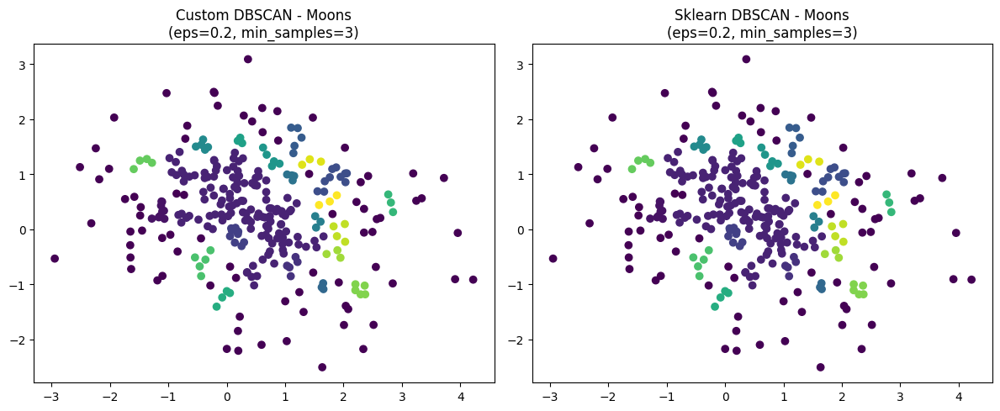

Dataset: Moons | eps: 0.2, min_samples: 5
Custom DBSCAN:
  ARI: 0.002
  Homogeneity: 0.053
  Completeness: 0.028
  V-Measure: 0.036
  Silhouette: 0.085
  Noise Points: 149
Sklearn DBSCAN:
  ARI: 0.002
  Homogeneity: 0.053
  Completeness: 0.028
  V-Measure: 0.036
  Silhouette: 0.085
  Noise Points: 149



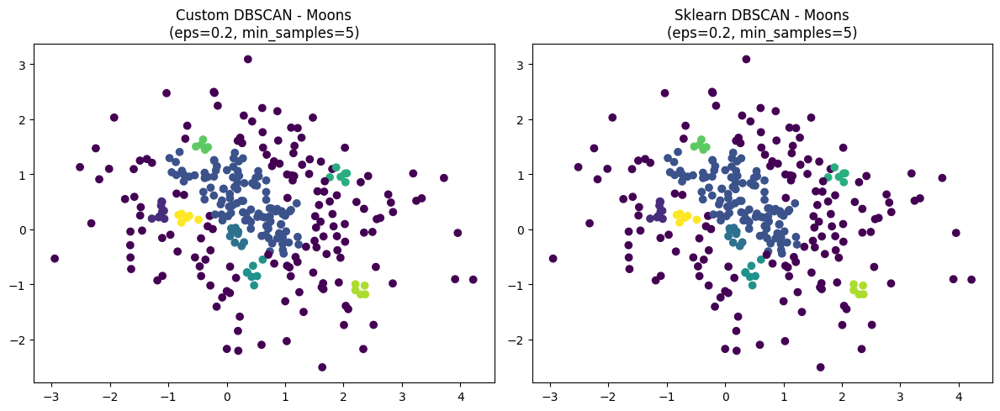

Dataset: Moons | eps: 0.2, min_samples: 7
Custom DBSCAN:
  ARI: 0.007
  Homogeneity: 0.052
  Completeness: 0.029
  V-Measure: 0.037
  Silhouette: 0.344
  Noise Points: 192
Sklearn DBSCAN:
  ARI: 0.007
  Homogeneity: 0.052
  Completeness: 0.029
  V-Measure: 0.037
  Silhouette: 0.344
  Noise Points: 192



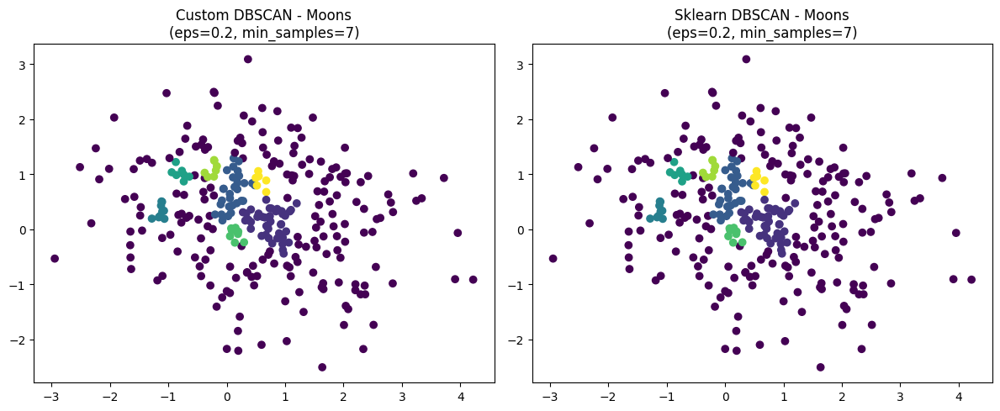

Dataset: Moons | eps: 0.3, min_samples: 3
Custom DBSCAN:
  ARI: 0.011
  Homogeneity: 0.069
  Completeness: 0.059
  V-Measure: 0.064
  Silhouette: 0.012
  Noise Points: 35
Sklearn DBSCAN:
  ARI: 0.011
  Homogeneity: 0.069
  Completeness: 0.059
  V-Measure: 0.064
  Silhouette: 0.012
  Noise Points: 35



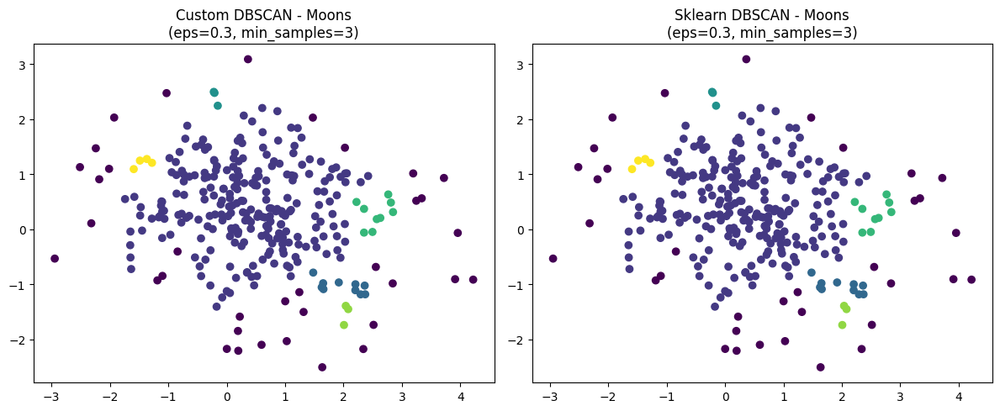

Dataset: Moons | eps: 0.3, min_samples: 5
Custom DBSCAN:
  ARI: -0.000
  Homogeneity: 0.034
  Completeness: 0.033
  V-Measure: 0.033
  Silhouette: 0.268
  Noise Points: 77
Sklearn DBSCAN:
  ARI: -0.000
  Homogeneity: 0.034
  Completeness: 0.033
  V-Measure: 0.033
  Silhouette: 0.268
  Noise Points: 77



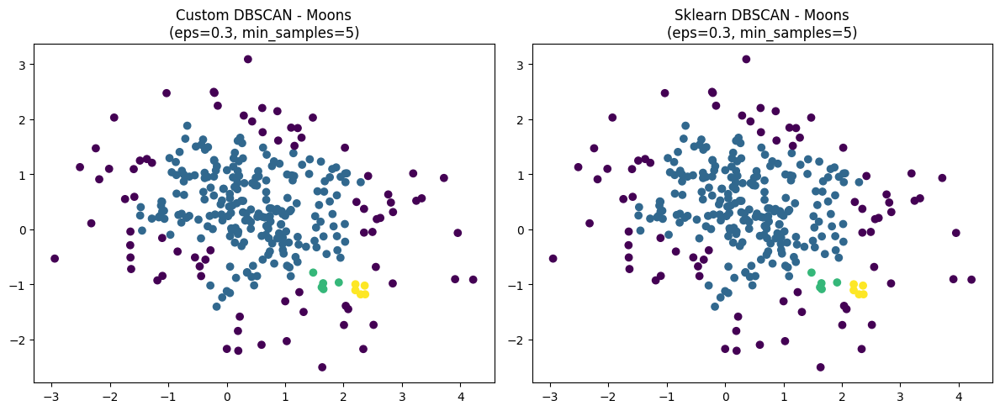

Dataset: Moons | eps: 0.3, min_samples: 7
Custom DBSCAN:
  ARI: 0.013
  Homogeneity: 0.036
  Completeness: 0.023
  V-Measure: 0.028
  Silhouette: 0.032
  Noise Points: 98
Sklearn DBSCAN:
  ARI: 0.013
  Homogeneity: 0.036
  Completeness: 0.023
  V-Measure: 0.028
  Silhouette: 0.032
  Noise Points: 98



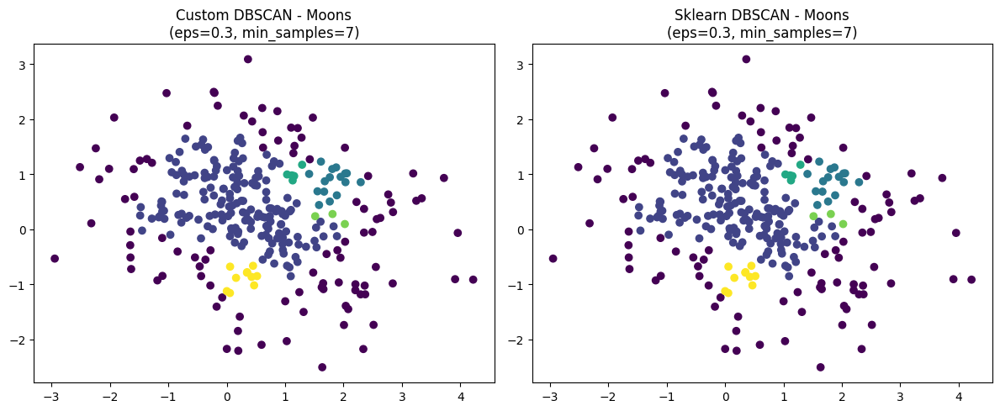

Dataset: Moons | eps: 0.4, min_samples: 3
Custom DBSCAN:
  ARI: 0.000
  Homogeneity: 0.036
  Completeness: 0.058
  V-Measure: 0.045
  Silhouette: 0.084
  Noise Points: 21
Sklearn DBSCAN:
  ARI: 0.000
  Homogeneity: 0.036
  Completeness: 0.058
  V-Measure: 0.045
  Silhouette: 0.084
  Noise Points: 21



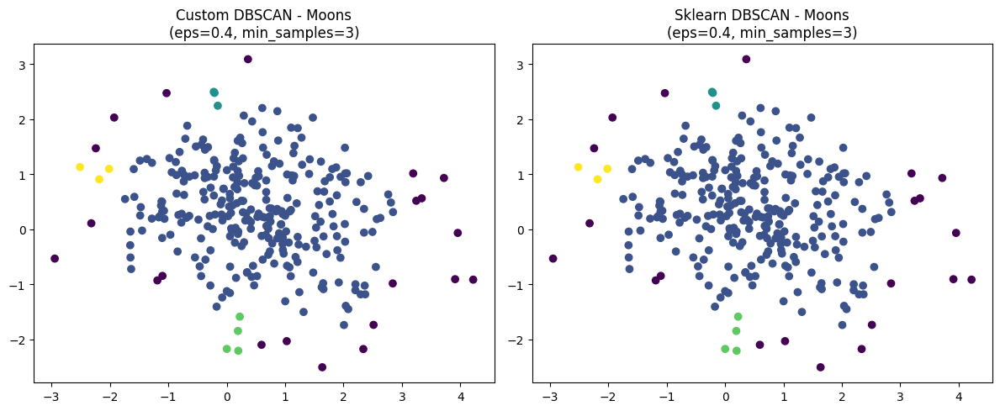

Dataset: Moons | eps: 0.4, min_samples: 5
Custom DBSCAN:
  ARI: -0.001
  Homogeneity: 0.001
  Completeness: 0.001
  V-Measure: 0.001
  Silhouette: nan
  Noise Points: 33
Sklearn DBSCAN:
  ARI: -0.001
  Homogeneity: 0.001
  Completeness: 0.001
  V-Measure: 0.001
  Silhouette: nan
  Noise Points: 33



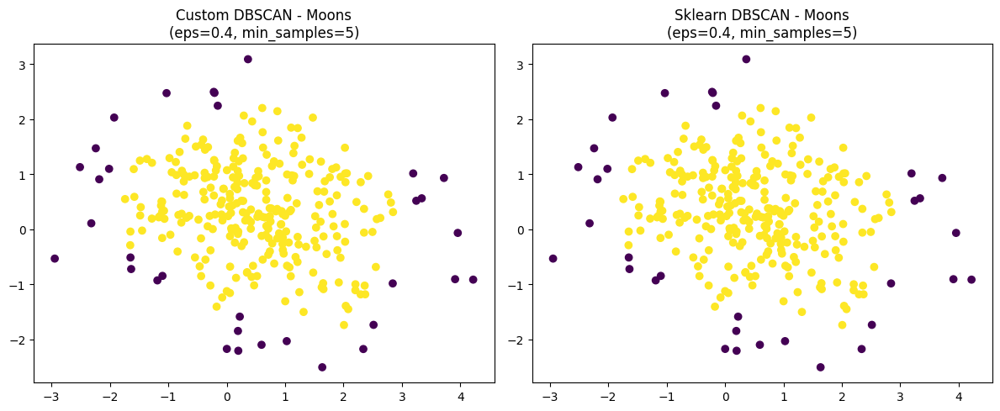

Dataset: Moons | eps: 0.4, min_samples: 7
Custom DBSCAN:
  ARI: 0.004
  Homogeneity: 0.023
  Completeness: 0.023
  V-Measure: 0.023
  Silhouette: 0.117
  Noise Points: 47
Sklearn DBSCAN:
  ARI: 0.004
  Homogeneity: 0.023
  Completeness: 0.023
  V-Measure: 0.023
  Silhouette: 0.117
  Noise Points: 47



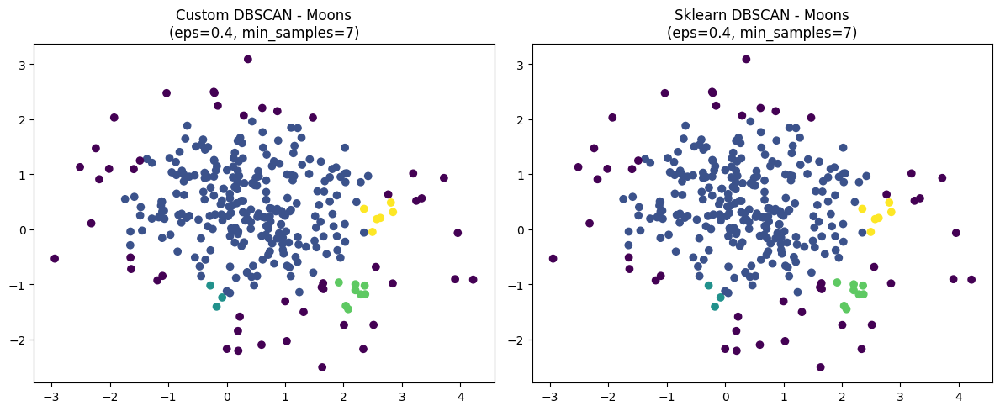

Dataset: Circles | eps: 0.2, min_samples: 3
Custom DBSCAN:
  ARI: 1.000
  Homogeneity: 1.000
  Completeness: 1.000
  V-Measure: 1.000
  Silhouette: 0.041
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 1.000
  Homogeneity: 1.000
  Completeness: 1.000
  V-Measure: 1.000
  Silhouette: 0.041
  Noise Points: 0



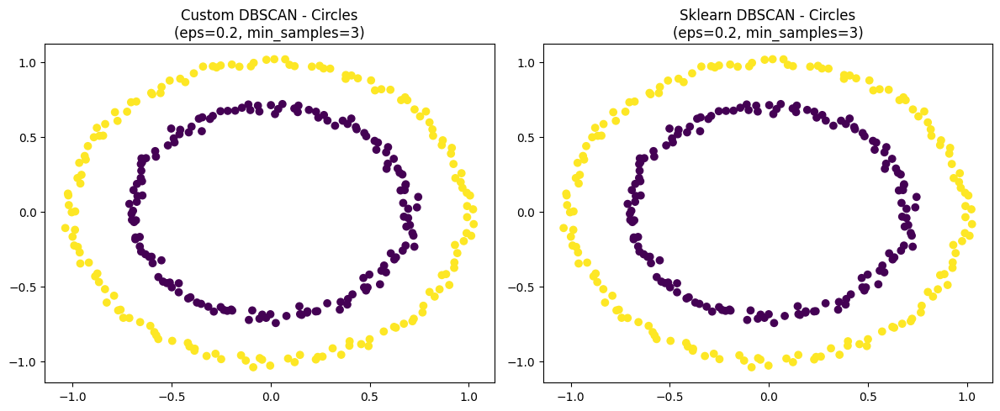

Dataset: Circles | eps: 0.2, min_samples: 5
Custom DBSCAN:
  ARI: 1.000
  Homogeneity: 1.000
  Completeness: 1.000
  V-Measure: 1.000
  Silhouette: 0.041
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 1.000
  Homogeneity: 1.000
  Completeness: 1.000
  V-Measure: 1.000
  Silhouette: 0.041
  Noise Points: 0



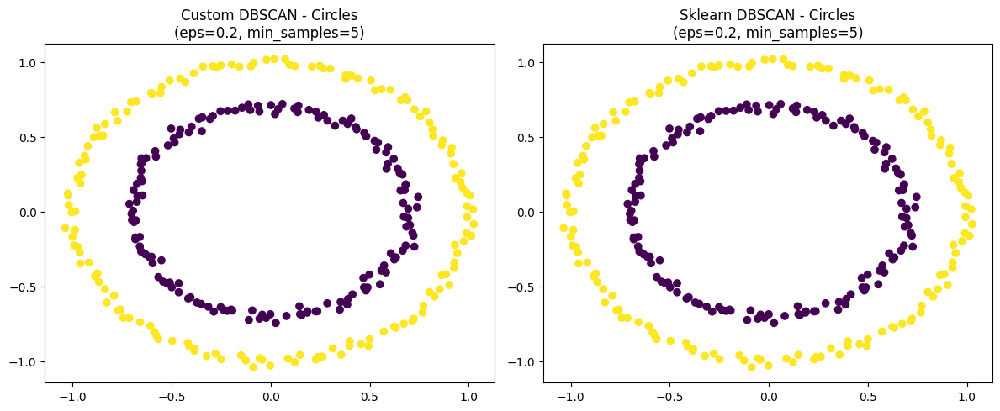

Dataset: Circles | eps: 0.2, min_samples: 7
Custom DBSCAN:
  ARI: 1.000
  Homogeneity: 1.000
  Completeness: 1.000
  V-Measure: 1.000
  Silhouette: 0.041
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 1.000
  Homogeneity: 1.000
  Completeness: 1.000
  V-Measure: 1.000
  Silhouette: 0.041
  Noise Points: 0



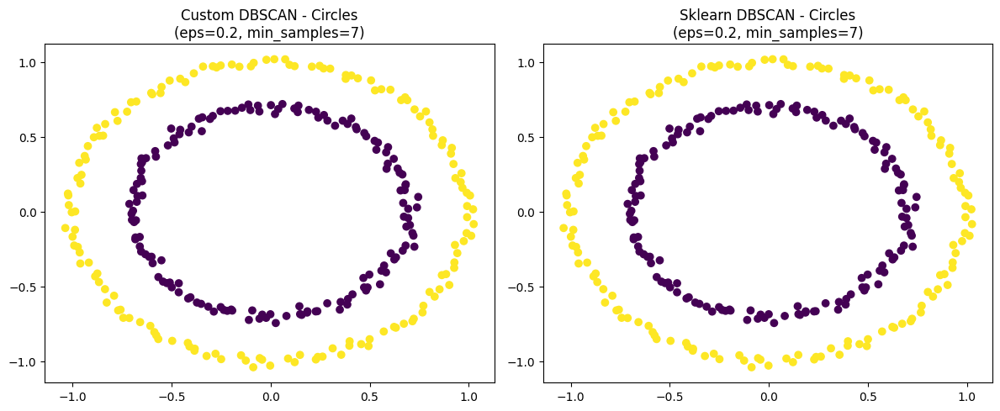

Dataset: Circles | eps: 0.3, min_samples: 3
Custom DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0



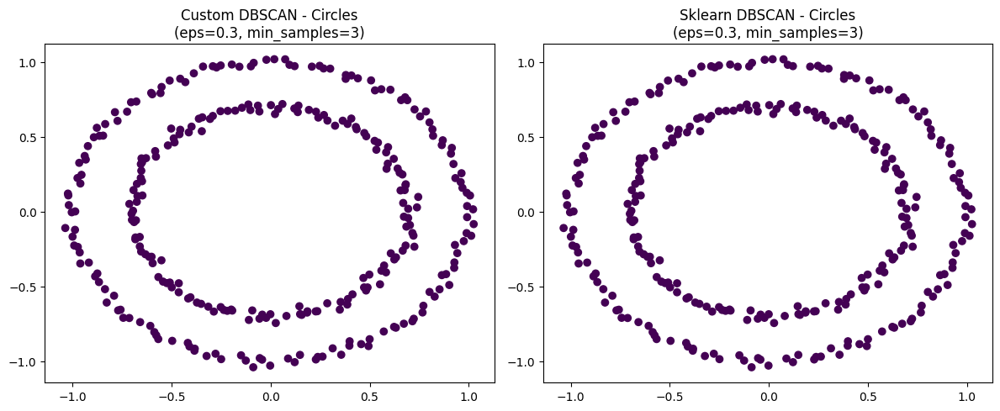

Dataset: Circles | eps: 0.3, min_samples: 5
Custom DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0



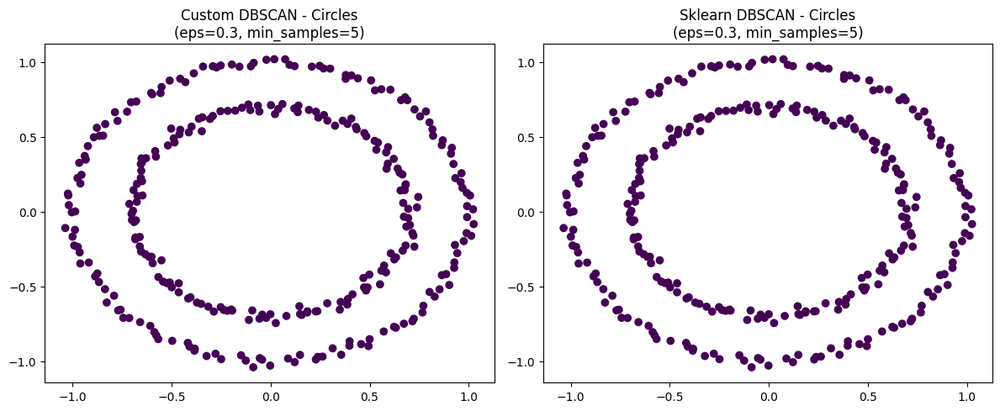

Dataset: Circles | eps: 0.3, min_samples: 7
Custom DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0



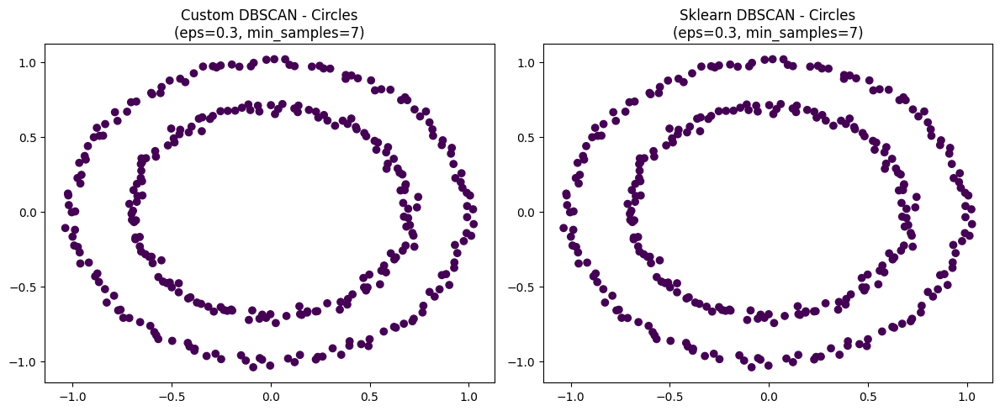

Dataset: Circles | eps: 0.4, min_samples: 3
Custom DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0



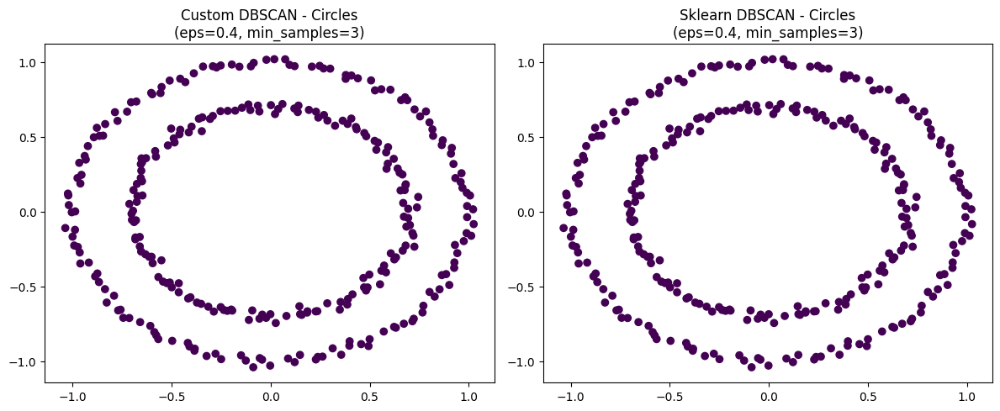

Dataset: Circles | eps: 0.4, min_samples: 5
Custom DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0



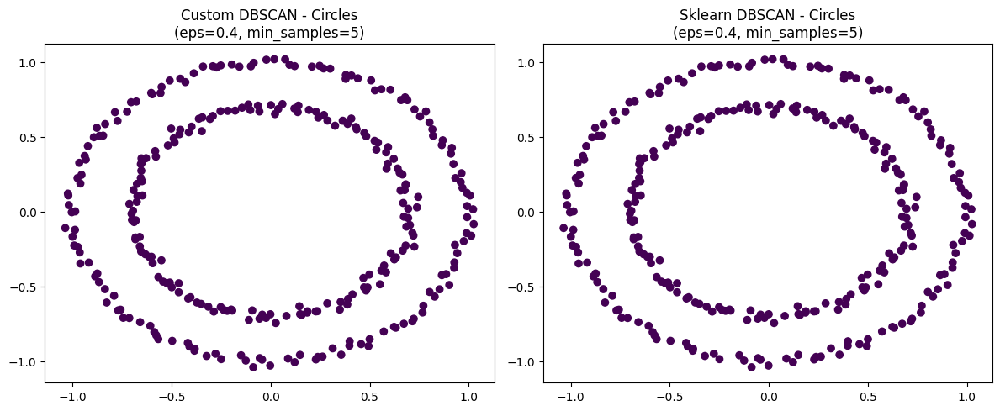

Dataset: Circles | eps: 0.4, min_samples: 7
Custom DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0
Sklearn DBSCAN:
  ARI: 0.000
  Homogeneity: 0.000
  Completeness: 1.000
  V-Measure: 0.000
  Silhouette: nan
  Noise Points: 0



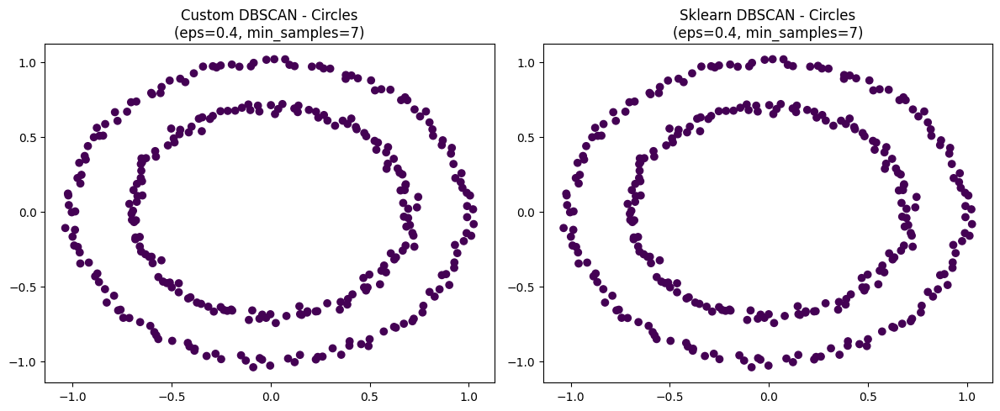

Dataset: Blobs | eps: 0.2, min_samples: 3
Custom DBSCAN:
  ARI: 0.355
  Homogeneity: 0.766
  Completeness: 0.387
  V-Measure: 0.514
  Silhouette: 0.215
  Noise Points: 71
Sklearn DBSCAN:
  ARI: 0.355
  Homogeneity: 0.766
  Completeness: 0.387
  V-Measure: 0.514
  Silhouette: 0.215
  Noise Points: 71



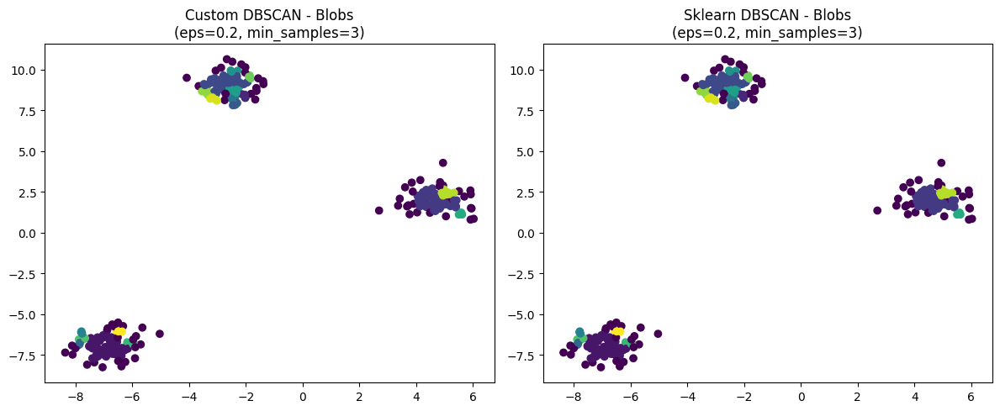

Dataset: Blobs | eps: 0.2, min_samples: 5
Custom DBSCAN:
  ARI: 0.130
  Homogeneity: 0.530
  Completeness: 0.326
  V-Measure: 0.404
  Silhouette: 0.473
  Noise Points: 142
Sklearn DBSCAN:
  ARI: 0.130
  Homogeneity: 0.530
  Completeness: 0.326
  V-Measure: 0.404
  Silhouette: 0.473
  Noise Points: 142



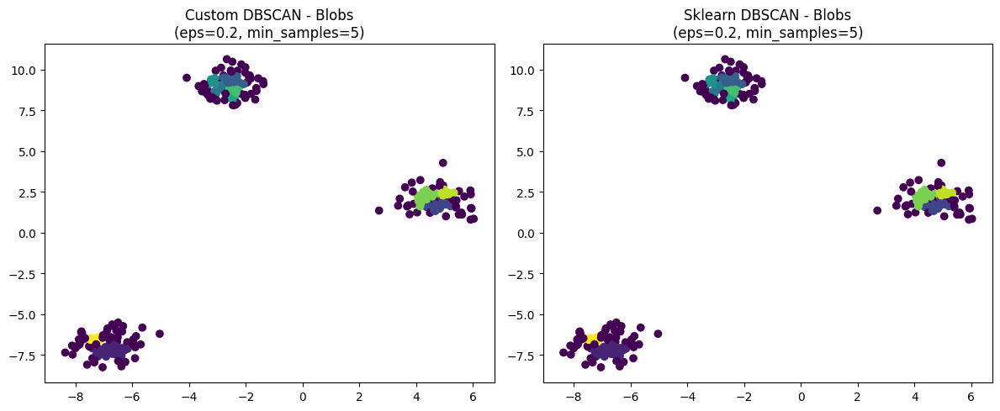

Dataset: Blobs | eps: 0.2, min_samples: 7
Custom DBSCAN:
  ARI: 0.058
  Homogeneity: 0.336
  Completeness: 0.291
  V-Measure: 0.312
  Silhouette: 0.710
  Noise Points: 201
Sklearn DBSCAN:
  ARI: 0.058
  Homogeneity: 0.336
  Completeness: 0.291
  V-Measure: 0.312
  Silhouette: 0.710
  Noise Points: 201



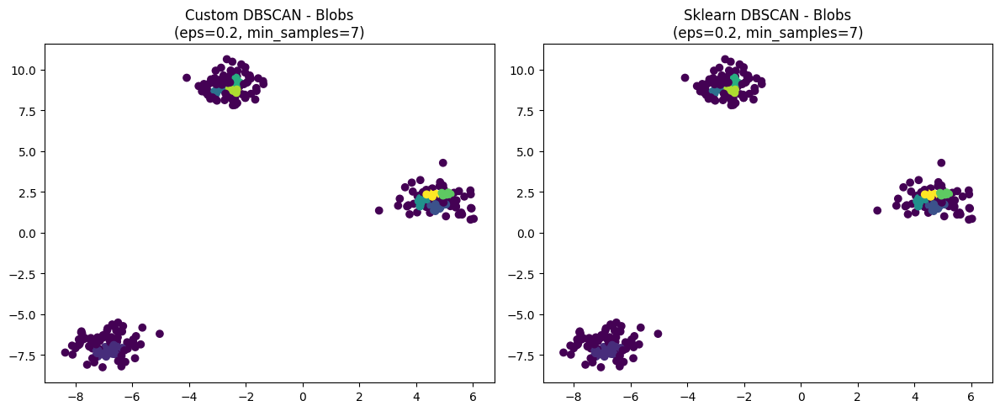

Dataset: Blobs | eps: 0.3, min_samples: 3
Custom DBSCAN:
  ARI: 0.751
  Homogeneity: 0.897
  Completeness: 0.637
  V-Measure: 0.745
  Silhouette: 0.499
  Noise Points: 32
Sklearn DBSCAN:
  ARI: 0.751
  Homogeneity: 0.897
  Completeness: 0.637
  V-Measure: 0.745
  Silhouette: 0.499
  Noise Points: 32



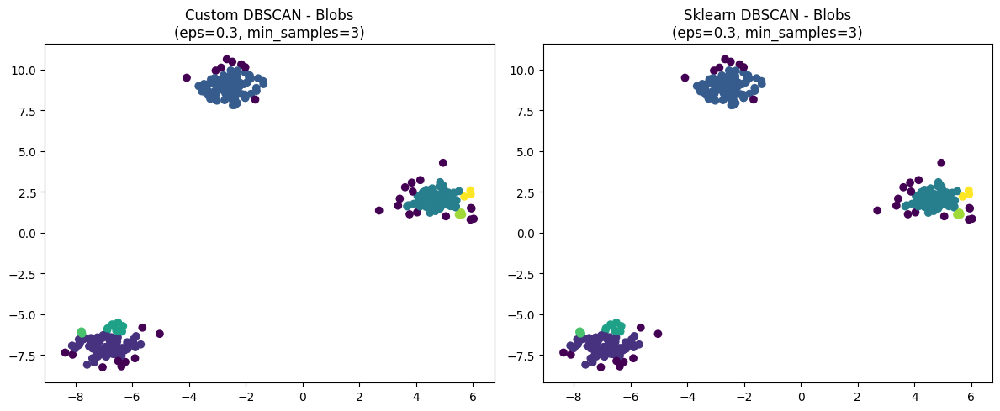

Dataset: Blobs | eps: 0.3, min_samples: 5
Custom DBSCAN:
  ARI: 0.677
  Homogeneity: 0.829
  Completeness: 0.609
  V-Measure: 0.702
  Silhouette: 0.491
  Noise Points: 52
Sklearn DBSCAN:
  ARI: 0.677
  Homogeneity: 0.829
  Completeness: 0.609
  V-Measure: 0.702
  Silhouette: 0.491
  Noise Points: 52



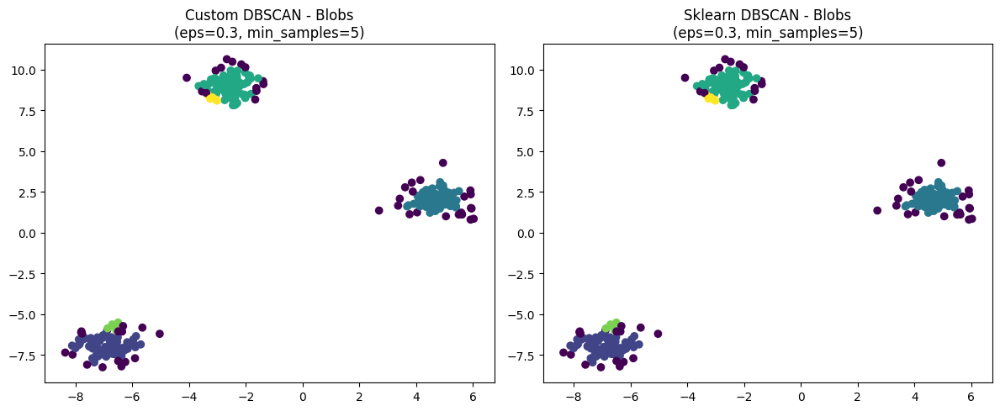

Dataset: Blobs | eps: 0.3, min_samples: 7
Custom DBSCAN:
  ARI: 0.511
  Homogeneity: 0.711
  Completeness: 0.539
  V-Measure: 0.613
  Silhouette: 0.733
  Noise Points: 87
Sklearn DBSCAN:
  ARI: 0.511
  Homogeneity: 0.711
  Completeness: 0.539
  V-Measure: 0.613
  Silhouette: 0.733
  Noise Points: 87



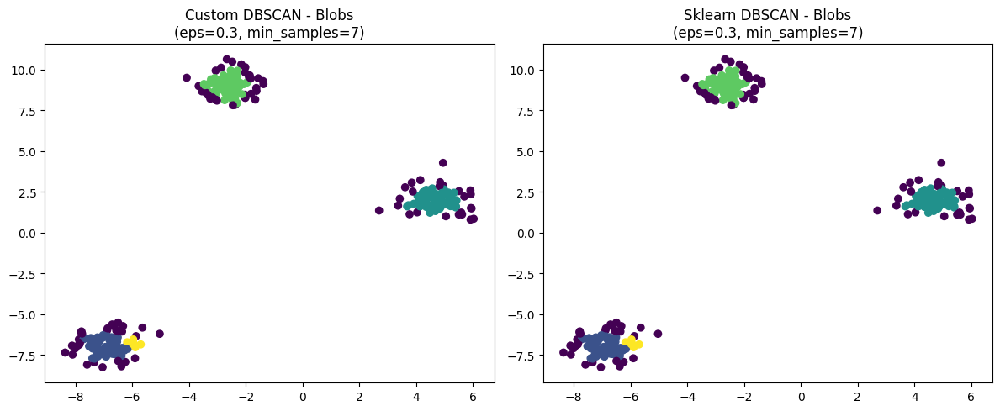

Dataset: Blobs | eps: 0.4, min_samples: 3
Custom DBSCAN:
  ARI: 0.925
  Homogeneity: 0.960
  Completeness: 0.849
  V-Measure: 0.901
  Silhouette: 0.914
  Noise Points: 15
Sklearn DBSCAN:
  ARI: 0.925
  Homogeneity: 0.960
  Completeness: 0.849
  V-Measure: 0.901
  Silhouette: 0.914
  Noise Points: 15



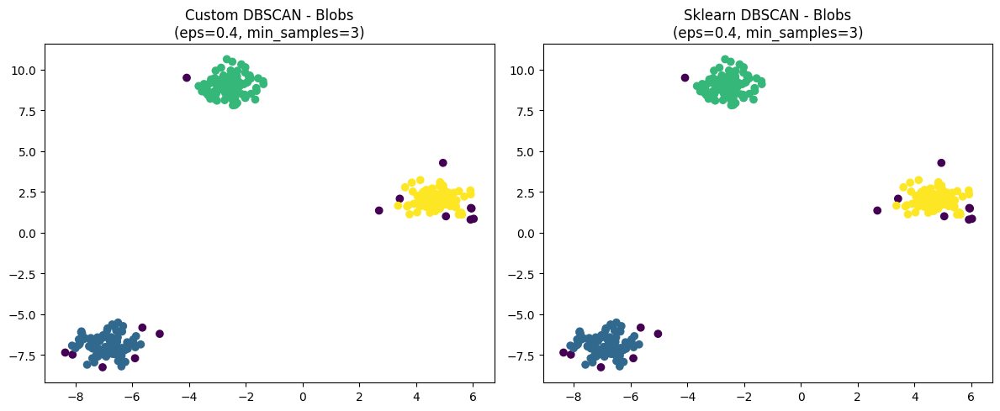

Dataset: Blobs | eps: 0.4, min_samples: 5
Custom DBSCAN:
  ARI: 0.853
  Homogeneity: 0.912
  Completeness: 0.766
  V-Measure: 0.833
  Silhouette: 0.919
  Noise Points: 29
Sklearn DBSCAN:
  ARI: 0.853
  Homogeneity: 0.912
  Completeness: 0.766
  V-Measure: 0.833
  Silhouette: 0.919
  Noise Points: 29



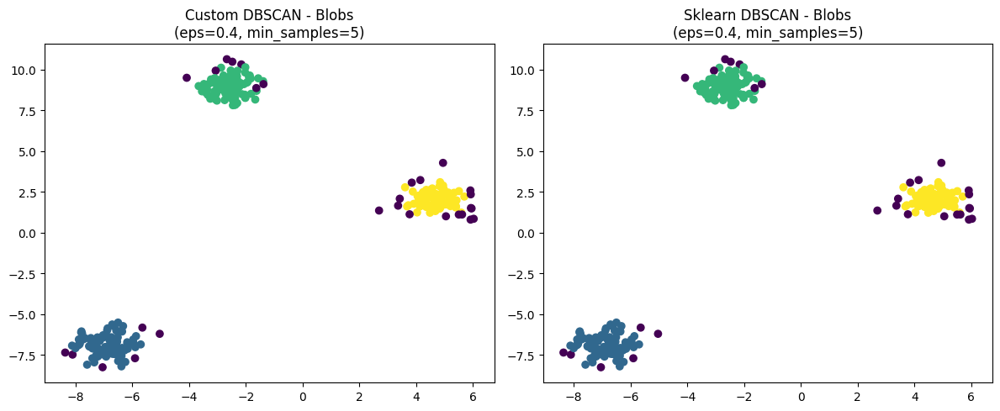

Dataset: Blobs | eps: 0.4, min_samples: 7
Custom DBSCAN:
  ARI: 0.813
  Homogeneity: 0.885
  Completeness: 0.730
  V-Measure: 0.800
  Silhouette: 0.921
  Noise Points: 36
Sklearn DBSCAN:
  ARI: 0.813
  Homogeneity: 0.885
  Completeness: 0.730
  V-Measure: 0.800
  Silhouette: 0.921
  Noise Points: 36



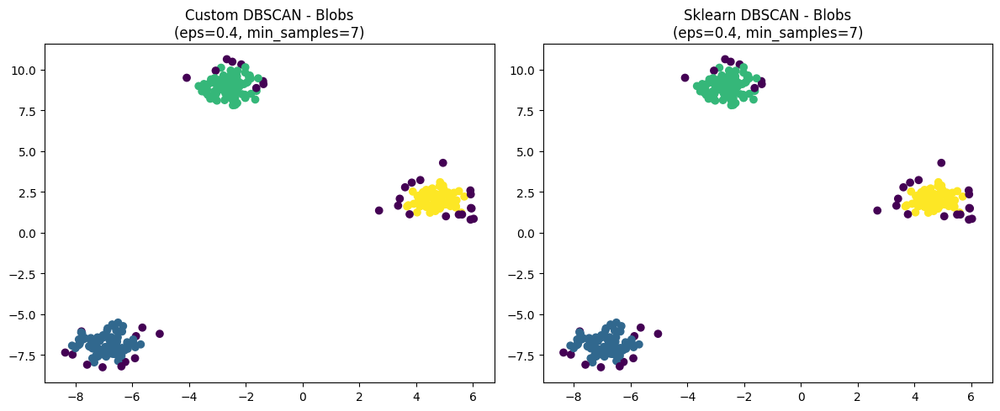

In [131]:
from sklearn.metrics import (
    adjusted_rand_score,
    silhouette_score,
    homogeneity_score,
    completeness_score,
    v_measure_score
)

def evaluate_clustering(X, true_labels, predicted_labels):
    mask = predicted_labels != -1  #Exclude noise for silhouette
    return {
        'ARI': adjusted_rand_score(true_labels, predicted_labels),
        'Homogeneity': homogeneity_score(true_labels, predicted_labels),
        'Completeness': completeness_score(true_labels, predicted_labels),
        'V-Measure': v_measure_score(true_labels, predicted_labels),
        'Silhouette': silhouette_score(X[mask], predicted_labels[mask]) if len(set(predicted_labels[mask])) > 1 else float('nan'),
        'Noise Points': np.sum(predicted_labels == -1)
    }

datasets = {
    'Moons': make_moons(n_samples=300, noise=0.8, random_state=42),
    'Circles': make_circles(n_samples=300, noise=0.02, factor=0.7, random_state=42),
    'Blobs': make_blobs(n_samples=300, centers=3, cluster_std=0.6, random_state=42)
}

eps_values = [0.2, 0.3, 0.4]
min_samples_values = [3, 5, 7]

for name, (X, true_labels) in datasets.items():
    for eps in eps_values:
        for min_samples in min_samples_values:
            #Custom DBSCAN
            custom_dbscan = CustomDBSCAN(eps=eps, min_samples=min_samples)
            labels_custom = custom_dbscan.fit_predict(X)

            #Sklearn
            sklearn_dbscan = SklearnDBSCAN(eps=eps, min_samples=min_samples)
            labels_sklearn = sklearn_dbscan.fit_predict(X)

            #Produce scores
            metrics_custom = evaluate_clustering(X, true_labels, labels_custom)
            metrics_sklearn = evaluate_clustering(X, true_labels, labels_sklearn)

            #Print evaluation
            print(f"Dataset: {name} | eps: {eps}, min_samples: {min_samples}")
            print("Custom DBSCAN:")
            for k, v in metrics_custom.items():
                print(f"  {k}: {v:.3f}" if isinstance(v, float) else f"  {k}: {v}")
            print("Sklearn DBSCAN:")
            for k, v in metrics_sklearn.items():
                print(f"  {k}: {v:.3f}" if isinstance(v, float) else f"  {k}: {v}")
            print()

            #Plot
            fig, axes = plt.subplots(1, 2, figsize=(12, 5))
            axes[0].scatter(X[:, 0], X[:, 1], c=labels_custom, cmap='viridis')
            axes[0].set_title(f"Custom DBSCAN - {name}\n(eps={eps}, min_samples={min_samples})")

            axes[1].scatter(X[:, 0], X[:, 1], c=labels_sklearn, cmap='viridis')
            axes[1].set_title(f"Sklearn DBSCAN - {name}\n(eps={eps}, min_samples={min_samples})")

            plt.tight_layout()
            plt.show()


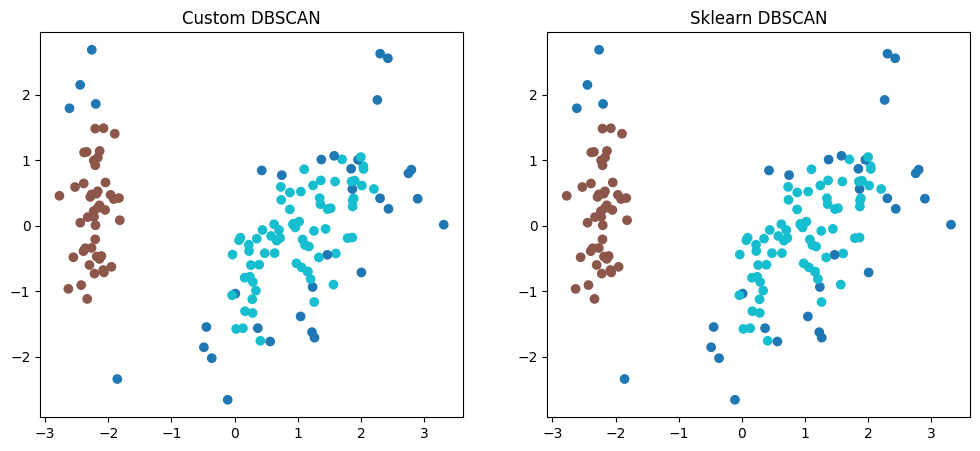

Custom DBSCAN clusters: 2
Sklearn DBSCAN clusters: 2


In [133]:
from sklearn.datasets import load_iris  # or load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN as SklearnDBSCAN
import matplotlib.pyplot as plt
import numpy as np

# Load dataset
data = load_iris()  # or load_wine()
X = data.data
X_scaled = StandardScaler().fit_transform(X)

#CustomDBSCAN
custom_model = CustomDBSCAN(eps=0.5, min_samples=5)
custom_labels = custom_model.fit_predict(X_scaled)

#Sklearn DBSCAN
sklearn_model = SklearnDBSCAN(eps=0.5, min_samples=5)
sklearn_labels = sklearn_model.fit_predict(X_scaled)

#PCA visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

#Plot CustomDBSCAN
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=custom_labels, cmap='tab10')
plt.title("Custom DBSCAN")

#Plot Sklearn DBSCAN
plt.subplot(1, 2, 2)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=sklearn_labels, cmap='tab10')
plt.title("Sklearn DBSCAN")
plt.show()

#Checking how many clusters were found
print(f"Custom DBSCAN clusters: {len(set(custom_labels)) - (1 if -1 in custom_labels else 0)}")
print(f"Sklearn DBSCAN clusters: {len(set(sklearn_labels)) - (1 if -1 in sklearn_labels else 0)}")


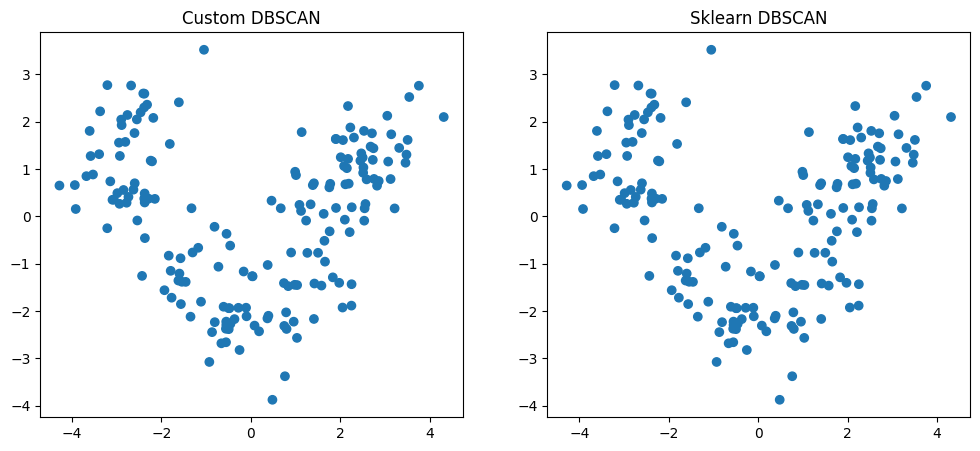

Custom DBSCAN clusters: 0
Sklearn DBSCAN clusters: 0


In [134]:
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN as SklearnDBSCAN
import matplotlib.pyplot as plt
import numpy as np

# Load dataset
data = load_wine()
X = data.data
X_scaled = StandardScaler().fit_transform(X)

#CustomDBSCAN
custom_model = CustomDBSCAN(eps=0.5, min_samples=10)
custom_labels = custom_model.fit_predict(X_scaled)

#Sklearn DBSCAN
sklearn_model = SklearnDBSCAN(eps=0.5, min_samples=10)
sklearn_labels = sklearn_model.fit_predict(X_scaled)

#PCA visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

#Plot CustomDBSCAN
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=custom_labels, cmap='tab10')
plt.title("Custom DBSCAN")

#Plot Sklearn DBSCAN
plt.subplot(1, 2, 2)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=sklearn_labels, cmap='tab10')
plt.title("Sklearn DBSCAN")
plt.show()

#Checking how many clusters were found
print(f"Custom DBSCAN clusters: {len(set(custom_labels)) - (1 if -1 in custom_labels else 0)}")
print(f"Sklearn DBSCAN clusters: {len(set(sklearn_labels)) - (1 if -1 in sklearn_labels else 0)}")


OPTICS (variant of DBSCAN)
- No fixed eps and plots "reachability"

In [135]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from heapq import heappush, heappop

class CustomOPTICS:
    def __init__(self, min_samples=5, max_eps=np.inf):
        self.min_samples = min_samples
        self.max_eps = max_eps

    def fit(self, X):
        self.X = np.asarray(X)
        n_samples = len(X)

        #Initialize NearestNeighbors and Compute Core Distances
        self.neigh = NearestNeighbors(n_neighbors=self.min_samples)
        self.neigh.fit(X)
        
        self.core_distances = self._compute_core_distances(X)

        #Initialize reachability and processed lists
        self.reachability_ = np.full(n_samples, np.inf)
        self.ordering_ = []
        processed = np.zeros(n_samples, dtype=bool)

        #Loop through all points and expand clusters
        for point in range(n_samples):
            if not processed[point]:
                self._expand_cluster_order(point, processed)

        return self
    #Computing core distance
    def _compute_core_distances(self, X):
        #Use Nearest Neighbors to find distances to the min_samples-th nearest neighbor
        knn = NearestNeighbors(n_neighbors=self.min_samples)
        knn.fit(X)
        distances, _ = knn.kneighbors(X)

        #Ensure all points have a computed core distance
        core_distances = np.maximum(distances[:, -1], np.min(distances[:, :-1], axis=1))
        return core_distances

    #Extracting clusters
    def _expand_cluster_order(self, point, processed):
        neighbors = self.neigh.radius_neighbors([self.X[point]], radius=self.max_eps, return_distance=False)[0]
        processed[point] = True
        self.ordering_.append(point)

        seeds = []
        if self.core_distances[point] != np.inf:
            for neighbor in neighbors:
                if not processed[neighbor]:
                    new_reach_dist = max(self.core_distances[point], np.linalg.norm(self.X[point] - self.X[neighbor]))
                    self.reachability_[neighbor] = min(self.reachability_[neighbor], new_reach_dist)  # Ensure reachability is updated
                    heappush(seeds, (new_reach_dist, neighbor))

        while seeds:
            _, current = heappop(seeds)
            if processed[current]:
                continue

            neighbors = self.neigh.radius_neighbors([self.X[current]], radius=self.max_eps, return_distance=False)[0]
            processed[current] = True
            self.ordering_.append(current)

            if self.core_distances[current] != np.inf:
                for neighbor in neighbors:
                    if not processed[neighbor]:
                        new_reach_dist = max(self.core_distances[current], np.linalg.norm(self.X[current] - self.X[neighbor]))
                        self.reachability_[neighbor] = min(self.reachability_[neighbor], new_reach_dist)  # Ensure reachability is updated
                        heappush(seeds, (new_reach_dist, neighbor))

    #Cluster extraction using eps
    def extract_dbscan_clusters(self, eps):
        labels = -1 * np.ones_like(self.reachability_, dtype=int)
        cluster_id = 0
        for i in range(len(self.ordering_) - 1):
            idx = self.ordering_[i]
            next_idx = self.ordering_[i + 1]

            if labels[idx] != -1 or self.reachability_[idx] > eps or self.core_distances[idx] > eps:
                continue

            #Start a new cluster
            labels[idx] = cluster_id

            #Expand cluster
            j = i + 1
            while j < len(self.ordering_) and self.reachability_[self.ordering_[j]] <= eps:
                labels[self.ordering_[j]] = cluster_id
                j += 1

            cluster_id += 1

        return labels

    #Cluster extraction using xi
    def extract_xi_clusters(self, xi=0.05, min_samples=None):
        reach = self.reachability_[self.ordering_]
        labels = -1 * np.ones_like(reach, dtype=int)
        n = len(reach)
        cluster_id = 0

        i = 0
        while i < n - 1:
            r_i = reach[i]

            j = i + 1
            while j < n and reach[j] < (1 - xi) * r_i:
                j += 1

            if j - i >= (min_samples or self.min_samples):
                for k in range(i, j):
                    labels[k] = cluster_id
                cluster_id += 1
                i = j
            else:
                i += 1

        final_labels = -1 * np.ones_like(labels)
        for i, idx in enumerate(self.ordering_):
            final_labels[idx] = labels[i]

        return final_labels

    #Visualize reachability plot
    def plot_reachability(self):
        plt.figure(figsize=(10, 4))
        reachability = [self.reachability_[p] for p in self.ordering_]
        plt.plot(reachability, marker='o')
        plt.title('Reachability Plot (Custom OPTICS)')
        plt.xlabel('Ordered Points')
        plt.ylabel('Reachability Distance')
        plt.show()

    def get_reachability_values(self):
        return np.array([self.reachability_[p] for p in self.ordering_])

    def get_labels(self):
        return np.array([self.reachability_[p] for p in self.ordering_])

Adjusted Rand Index (Custom OPTICS): 0.014


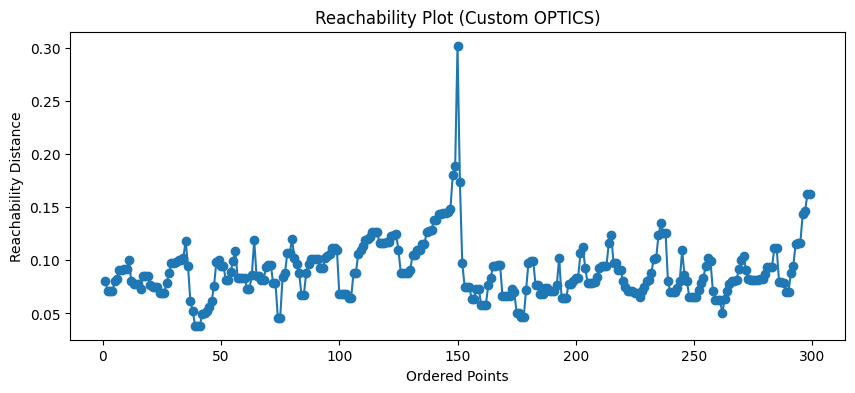

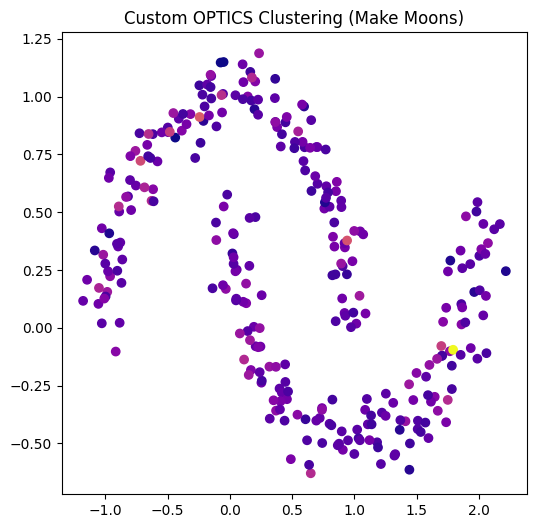

In [136]:
X, _ = make_moons(n_samples=300, noise=0.08, random_state=42)

#Fit Custom OPTICS
custom_optics = CustomOPTICS(min_samples=5, max_eps=0.5)
custom_optics.fit(X)
#labels_custom = custom_optics.extract_xi_clusters(xi=0.05)

ari_custom = adjusted_rand_score(_, labels_custom)
print(f"Adjusted Rand Index (Custom OPTICS): {ari_custom:.3f}")

#Plot Reachability for Custom OPTICS
custom_optics.plot_reachability()

#Get Labels from Custom OPTICS
labels_custom = custom_optics.get_labels()

plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c=labels_custom, cmap='plasma')
plt.title("Custom OPTICS Clustering (Make Moons)")
plt.show()

Adjusted Rand Index (Sklearn OPTICS): 0.014


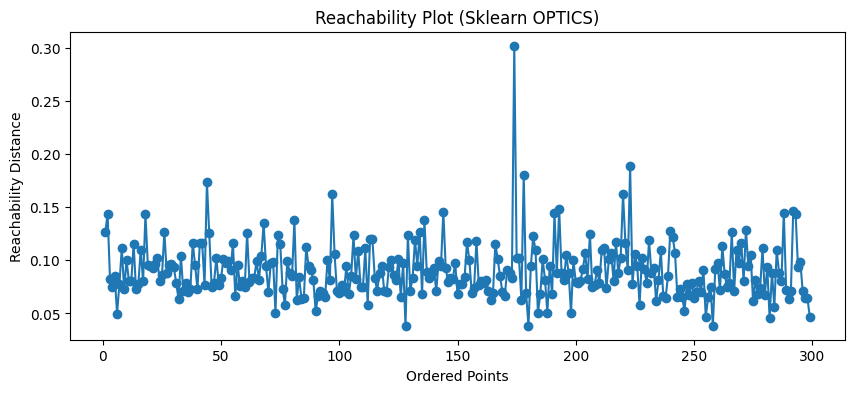

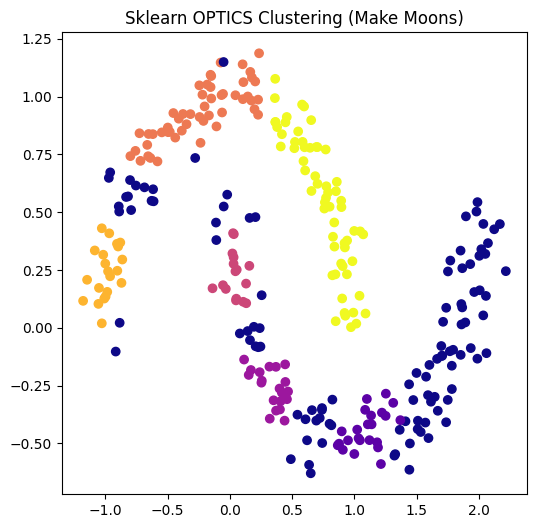

In [137]:
# --- Create Sample Data ---
X, y_moons = make_moons(n_samples=300, noise=0.08, random_state=42)

# --- Fit Sklearn OPTICS ---
sklearn_optics = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.05)
sklearn_optics.fit(X)

ari_sklearn = adjusted_rand_score(y_moons, labels_sklearn)

print(f"Adjusted Rand Index (Sklearn OPTICS): {ari_sklearn:.3f}")
# --- Reachability Plot for Sklearn OPTICS ---
plt.figure(figsize=(10, 4))
plt.plot(sklearn_optics.reachability_, marker='o')
plt.title('Reachability Plot (Sklearn OPTICS)')
plt.xlabel('Ordered Points')
plt.ylabel('Reachability Distance')
plt.show()

# --- Get Labels from Sklearn OPTICS ---
labels_sklearn = sklearn_optics.labels_

# --- Plot Results ---
plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c=labels_sklearn, cmap='plasma')
plt.title("Sklearn OPTICS Clustering (Make Moons)")
plt.show()


Adjusted Rand Index (Custom OPTICS): 0.975


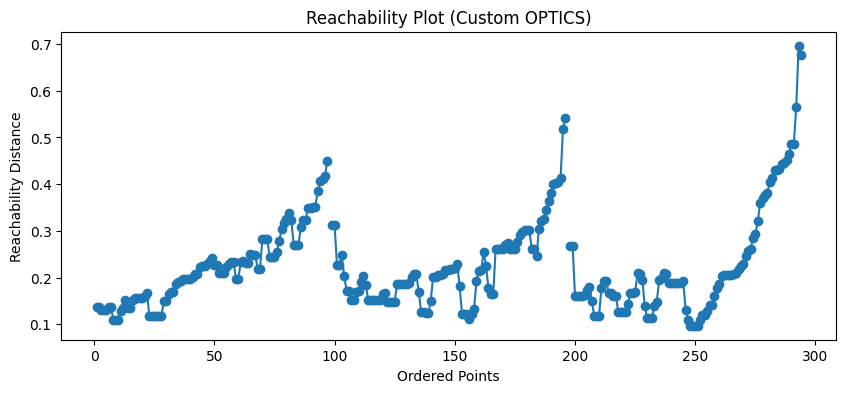

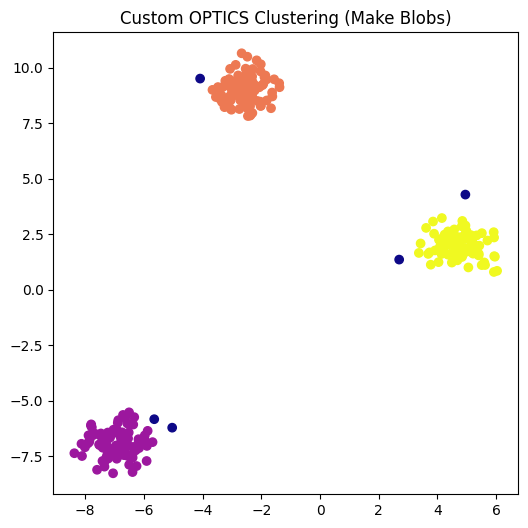

In [138]:
X, y_true = make_blobs(n_samples=300, centers=3, cluster_std=0.6, random_state=42)

#Fit Custom OPTICS
custom_optics = CustomOPTICS(min_samples=5, max_eps=0.5)
custom_optics.fit(X)
#print("Computed Core Distances:", custom_optics.core_distances)
labels_custom = custom_optics.extract_xi_clusters(xi=0.05)

ari_custom = adjusted_rand_score(y_true, labels_custom)
print(f"Adjusted Rand Index (Custom OPTICS): {ari_custom:.3f}")

#Plot Reachability for Custom OPTICS
custom_optics.plot_reachability()

plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c=labels_custom, cmap='plasma')
plt.title("Custom OPTICS Clustering (Make Blobs)")
plt.show()

#print("Custom OPTICS Reachability Values:", custom_optics.get_reachability_values())


Adjusted Rand Index (Sklearn OPTICS): 0.060


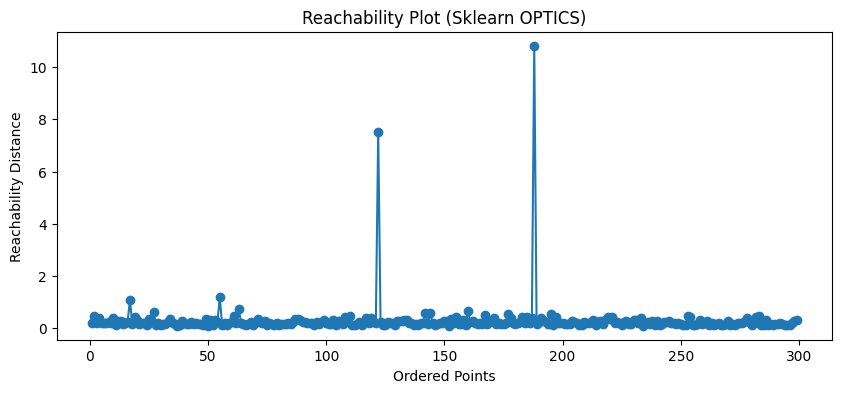

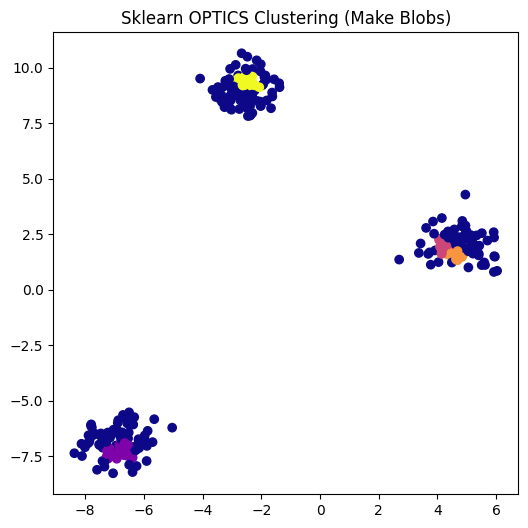

In [139]:
X, y_true = make_blobs(n_samples=300, centers=3, cluster_std=0.6, random_state=42)

#Fit Sklearn OPTICS
sklearn_optics = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.05)
sklearn_optics.fit(X)
#print("Computed Core Distances:", sklearn_optics.core_distances_)
labels_sklearn = sklearn_optics.labels_

ari_sklearn = adjusted_rand_score(y_true, labels_sklearn)

print(f"Adjusted Rand Index (Sklearn OPTICS): {ari_sklearn:.3f}")

#Reachability Plot for Sklearn OPTICS
plt.figure(figsize=(10, 4))
plt.plot(sklearn_optics.reachability_, marker='o')
plt.title('Reachability Plot (Sklearn OPTICS)')
plt.xlabel('Ordered Points')
plt.ylabel('Reachability Distance')
plt.show()

#Plot Results
plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c=labels_sklearn, cmap='plasma')
plt.title("Sklearn OPTICS Clustering (Make Blobs)")
plt.show()

#print("Sklearn Core Distances:", sklearn_optics.core_distances_)

Adjusted Rand Index (Custom OPTICS): 0.000


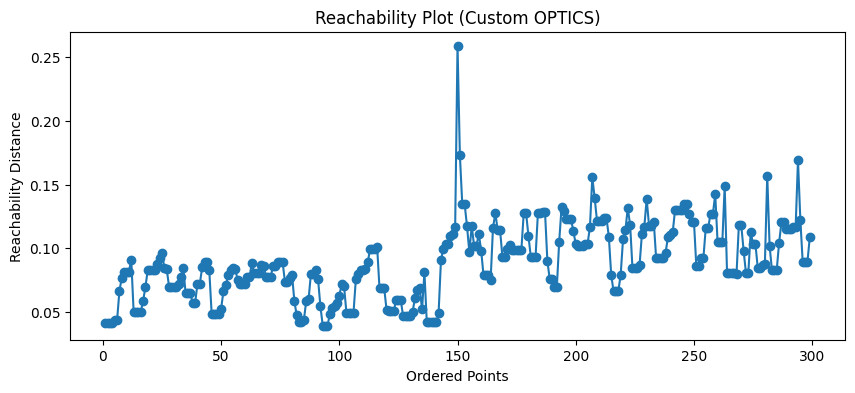

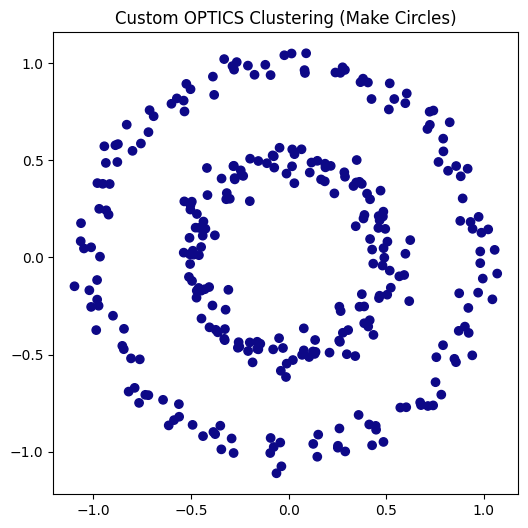

In [140]:
X, _ = make_circles(n_samples=300, noise=0.05, factor=0.5, random_state=42)

#Fit Custom OPTICS
custom_optics = CustomOPTICS(min_samples=5, max_eps=0.5)
custom_optics.fit(X)
labels_custom = custom_optics.extract_xi_clusters(xi=0.05)

ari_custom = adjusted_rand_score(_, labels_custom)
print(f"Adjusted Rand Index (Custom OPTICS): {ari_custom:.3f}")

#Plot Reachability for Custom OPTICS
custom_optics.plot_reachability()

plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c=labels_custom, cmap='plasma')
plt.title("Custom OPTICS Clustering (Make Circles)")
plt.show()

Adjusted Rand Index (Sklearn OPTICS): 0.173


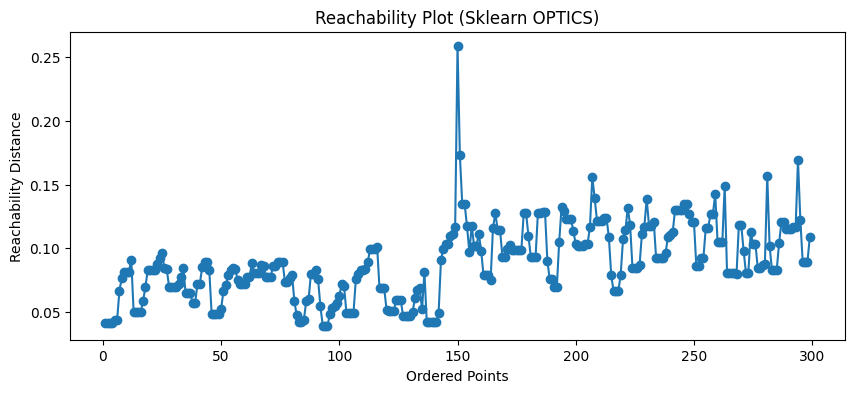

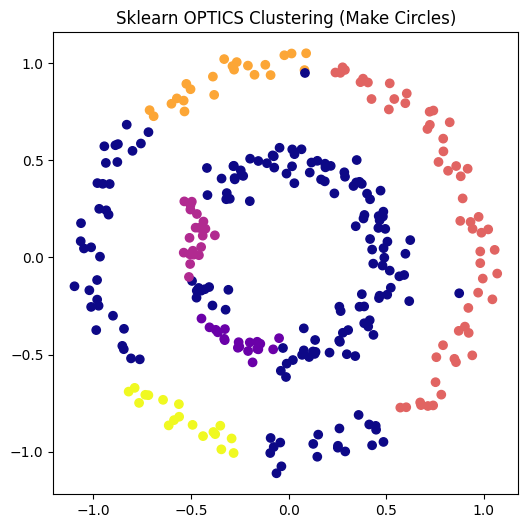

In [141]:
X, _ = make_circles(n_samples=300, noise=0.05, factor=0.5, random_state=42)

#Fit Sklearn OPTICS
sklearn_optics = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.05)
sklearn_optics.fit(X)

#Get Labels from Sklearn OPTICS
labels_sklearn = sklearn_optics.labels_

#Compute ARI
ari_sklearn = adjusted_rand_score(_, labels_sklearn)
print(f"Adjusted Rand Index (Sklearn OPTICS): {ari_sklearn:.3f}")

#Reachability Plot
plt.figure(figsize=(10, 4))
plt.plot(sklearn_optics.reachability_[sklearn_optics.ordering_], marker='o')
plt.title('Reachability Plot (Sklearn OPTICS)')
plt.xlabel('Ordered Points')
plt.ylabel('Reachability Distance')
plt.show()

#Plot Results
plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c=labels_sklearn, cmap='plasma')
plt.title("Sklearn OPTICS Clustering (Make Circles)")
plt.show()


HDBSCAN (variant of DBSCAN)
- varying density clusters (no fixed eps)

In [142]:
import numpy as np
from scipy.spatial.distance import euclidean
from scipy.sparse.csgraph import minimum_spanning_tree, connected_components
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

class CustomHDBSCAN:
    def __init__(self, min_samples=5, min_cluster_size=5):
        self.min_samples = min_samples
        self.min_cluster_size = min_cluster_size
        self.labels_ = None

    def fit(self, X):
        X = np.asarray(X)

        #Compute core distances
        core_distances = self._compute_core_distances(X)

        #Calculate mutual reachability distances
        mutual_reachability_distances = self._compute_mutual_reachability(X, core_distances)

        #Build minimum spanning tree (MST)
        mst = self._build_mst(mutual_reachability_distances)

        #Generate condensed tree (density-based pruning)
        condensed_tree = self._build_condensed_tree(mst, mutual_reachability_distances)

        #Extract clusters
        self.labels_ = self._extract_clusters(condensed_tree)

        return self

    def _compute_core_distances(self, X):
        #Compute core distances using k-nearest neighbors
        knn = NearestNeighbors(n_neighbors=self.min_samples)
        knn.fit(X)
        distances, _ = knn.kneighbors(X)
        core_distances = distances[:, -1]  #Distance to the k-th nearest neighbor
        return core_distances

    def _compute_mutual_reachability(self, X, core_distances):
        #Create a pairwise distance matrix with mutual reachability distances
        n_points = X.shape[0]
        mutual_reachability = np.zeros((n_points, n_points))

        for i in range(n_points):
            for j in range(n_points):
                if i != j:
                    dist = euclidean(X[i], X[j])
                    mutual_reachability[i, j] = max(core_distances[i], core_distances[j], dist)
        return mutual_reachability

    def _build_mst(self, distances):
        #Construct the minimum spanning tree using mutual reachability distances
        mst = minimum_spanning_tree(distances)
        return mst.toarray()

    def _build_condensed_tree(self, mst, distances):
        #Density-based pruning of MST to construct condensed tree
        density_threshold = np.percentile(mst[mst > 0], 99)  #Adjust threshold as needed
        pruned_tree = np.where(mst > density_threshold, 0, mst)  #Remove edges with high weights
        return pruned_tree

    def _extract_clusters(self, condensed_tree):
        #Extract clusters using connected components of the pruned tree
        num_components, labels = connected_components(condensed_tree)

        #Mark small clusters or noise points as -1
        unique, counts = np.unique(labels, return_counts=True)
        for cluster, count in zip(unique, counts):
            if count < self.min_cluster_size:
                labels[labels == cluster] = -1  #Mark as noise
        return labels


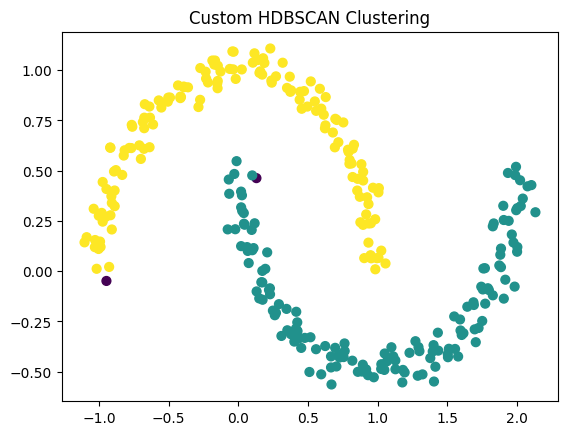

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


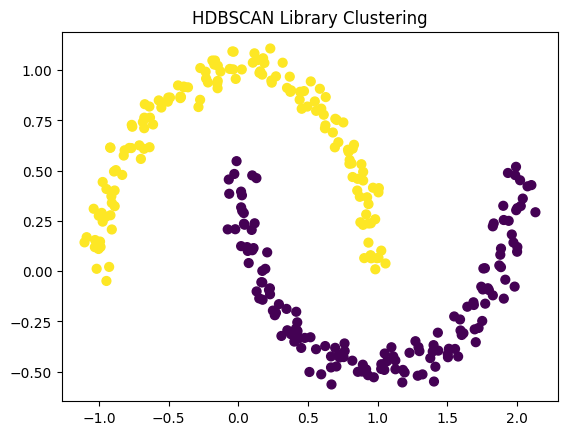

In [143]:
#Generate the moons dataset
X, _ = make_moons(n_samples=300, noise=0.05, random_state=42)

#Fit Custom HDBSCAN
custom_hdbscan = CustomHDBSCAN(min_samples=5, min_cluster_size=10)
custom_hdbscan.fit(X)

#plot the results
plt.scatter(X[:, 0], X[:, 1], c=custom_hdbscan.labels_, cmap='viridis', s=40)
plt.title("Custom HDBSCAN Clustering")
plt.show()

hdbscan_model = hdbscan.HDBSCAN(min_samples=5, min_cluster_size=10)
labels = hdbscan_model.fit_predict(X)

#plot the results
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', s=40)
plt.title("HDBSCAN Library Clustering")
plt.show()

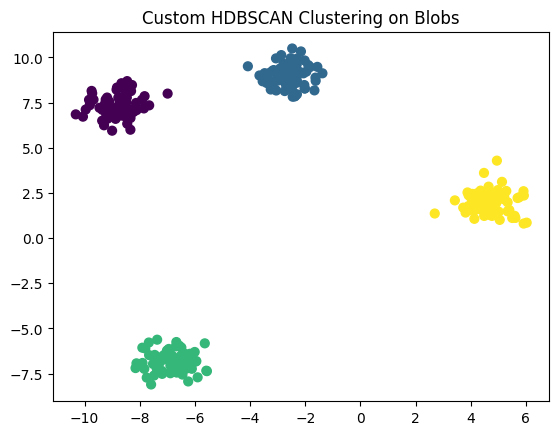

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


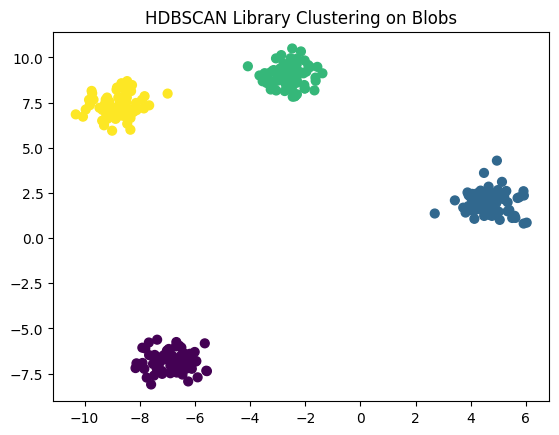

In [144]:
#Generate synthetic dataset using make_blobs
X, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.6, random_state=42)

# Fit the Custom HDBSCAN implementation
custom_hdbscan = CustomHDBSCAN(min_samples=5, min_cluster_size=10)
custom_hdbscan.fit(X)

#Visualize the clusters
plt.scatter(X[:, 0], X[:, 1], c=custom_hdbscan.labels_, cmap='viridis', s=40)
plt.title("Custom HDBSCAN Clustering on Blobs")
plt.show()


#Fit HDBSCAN from the library
hdbscan_model = hdbscan.HDBSCAN(min_samples=5, min_cluster_size=10)
library_labels = hdbscan_model.fit_predict(X)

#Visualize the library's clustering results
plt.scatter(X[:, 0], X[:, 1], c=library_labels, cmap='viridis', s=40)
plt.title("HDBSCAN Library Clustering on Blobs")
plt.show()

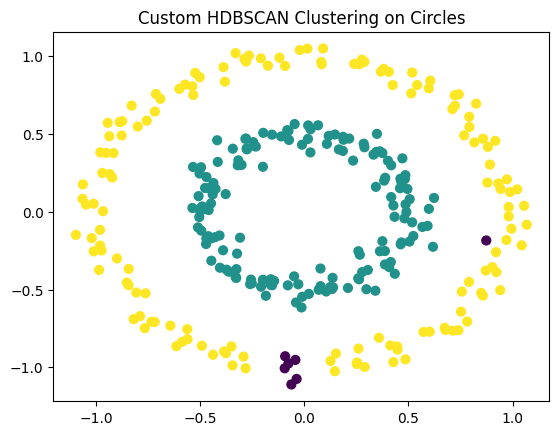

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


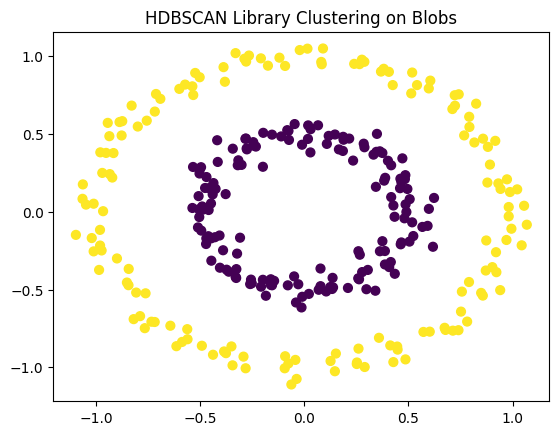

In [145]:
X, _ = make_circles(n_samples=300, factor=0.5, noise=0.05, random_state=42)

custom_hdbscan = CustomHDBSCAN(min_samples=5, min_cluster_size=10)
custom_hdbscan.fit(X)

#print("Custom HDBSCAN Labels on Circles:", custom_hdbscan.labels_)
plt.scatter(X[:, 0], X[:, 1], c=custom_hdbscan.labels_, cmap='viridis', s=40)
plt.title("Custom HDBSCAN Clustering on Circles")
plt.show()

hdbscan_model = hdbscan.HDBSCAN(min_samples=5, min_cluster_size=10)
library_labels = hdbscan_model.fit_predict(X)

#print("HDBSCAN Library Labels:", np.unique(library_labels))
plt.scatter(X[:, 0], X[:, 1], c=library_labels, cmap='viridis', s=40)
plt.title("HDBSCAN Library Clustering on Blobs")
plt.show()


/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


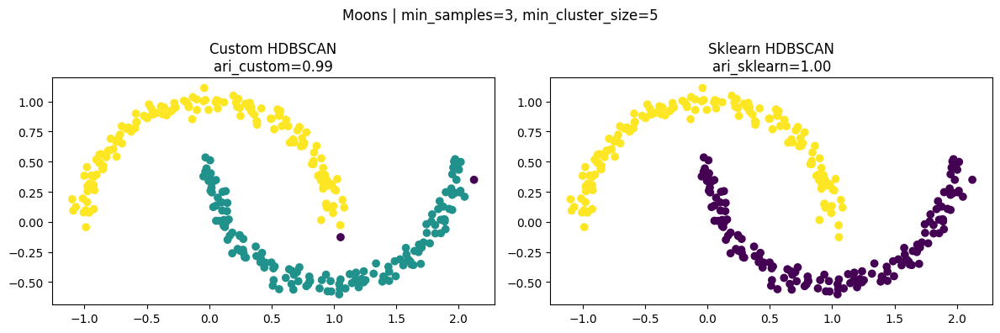

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


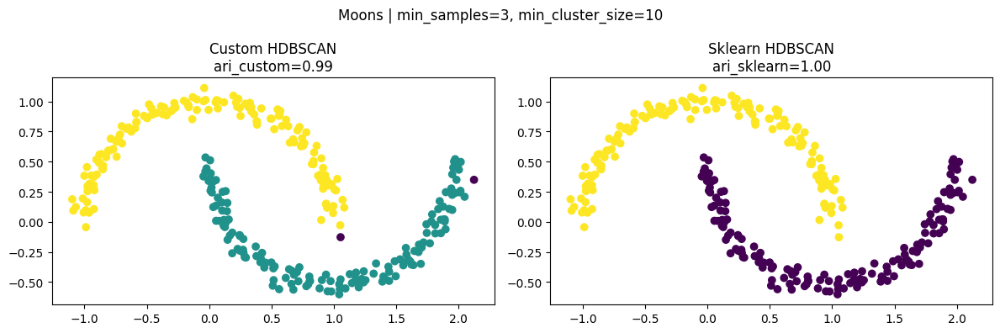

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


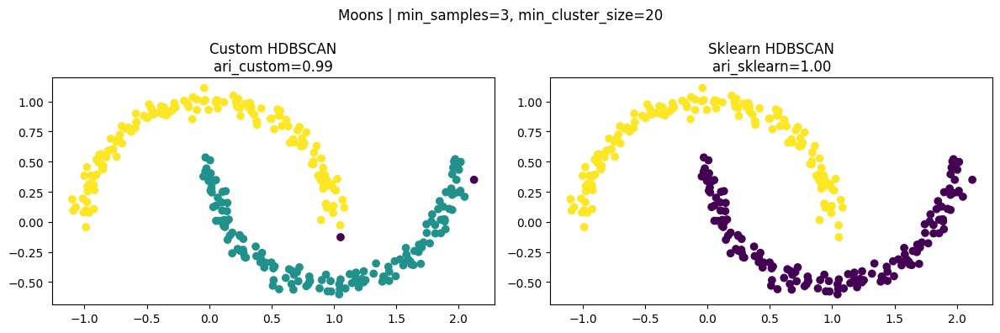

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


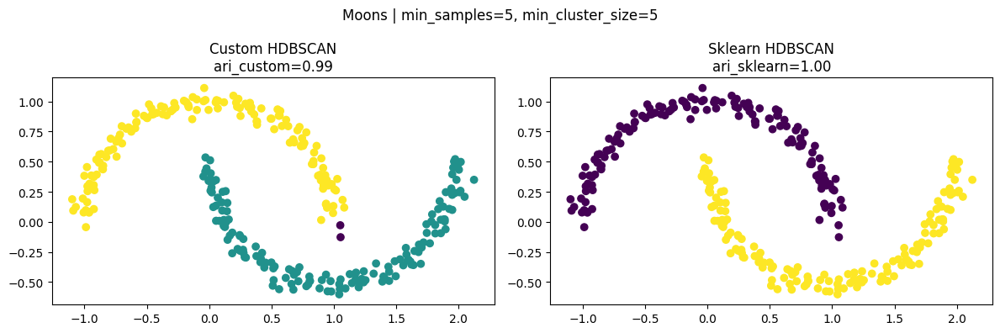

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


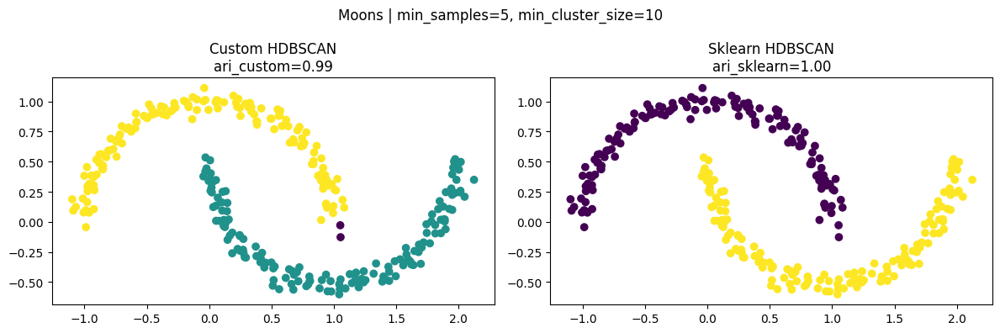

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


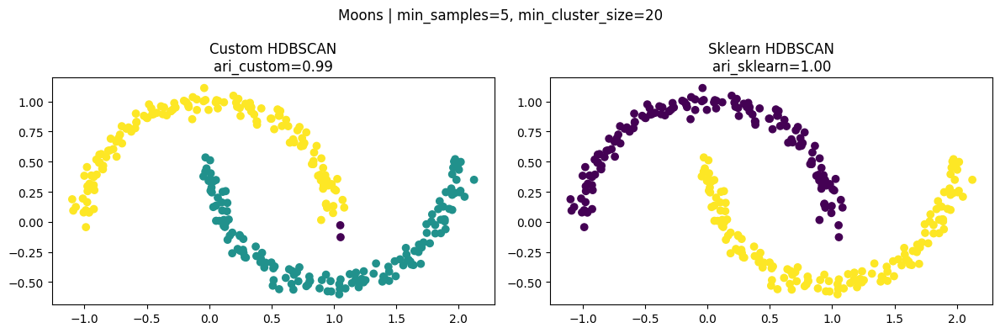

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


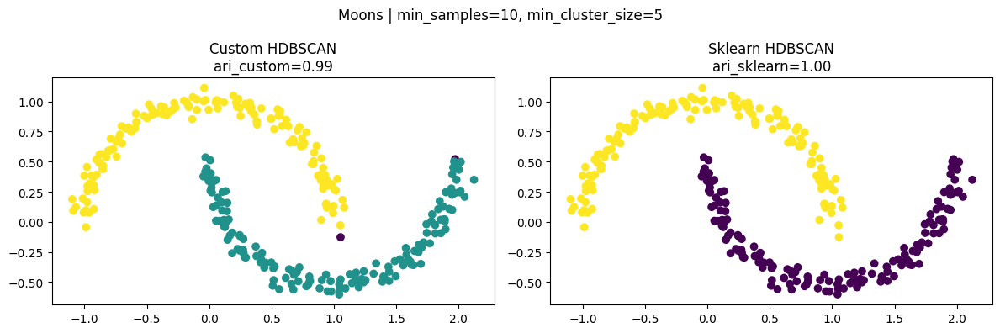

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


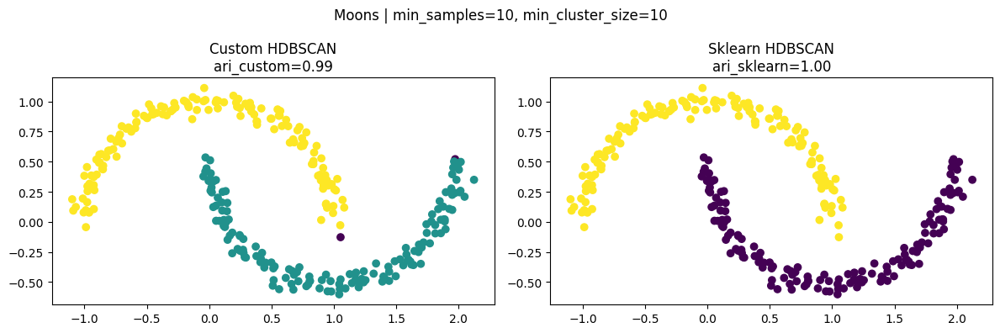

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


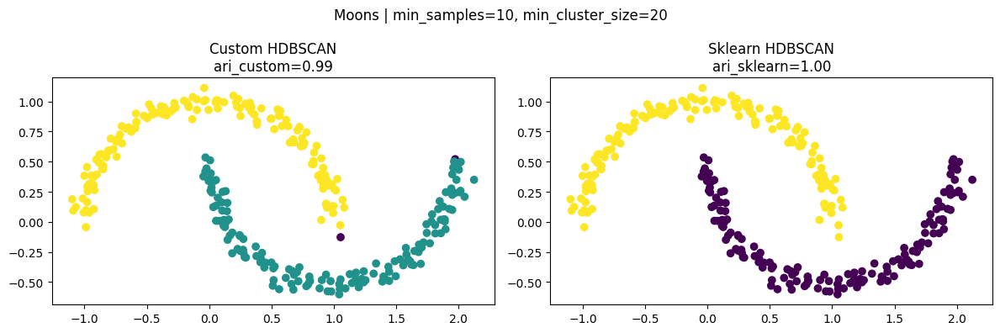

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


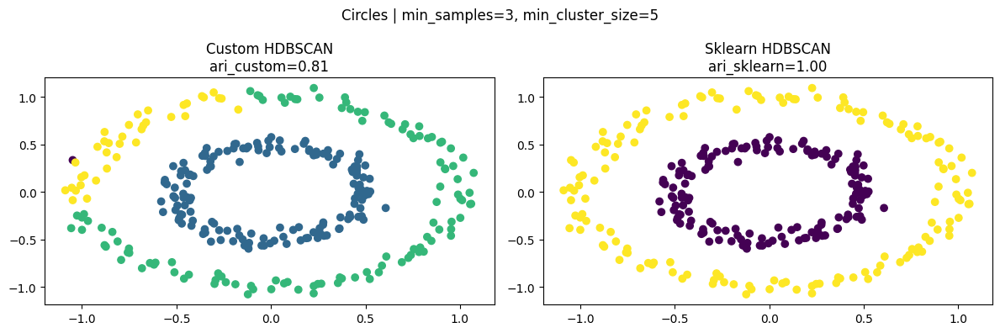

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


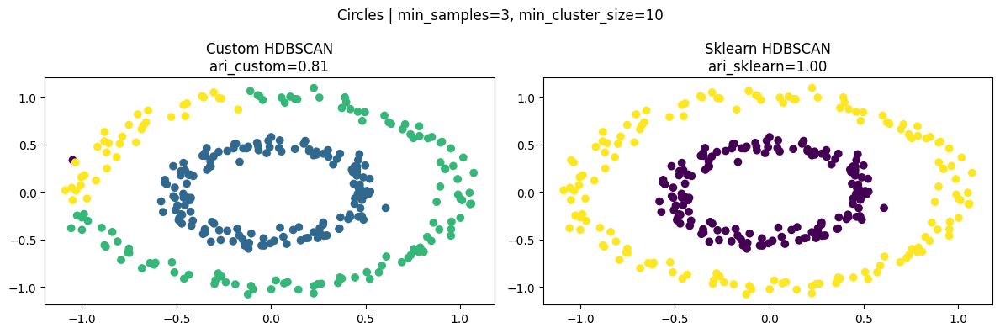

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


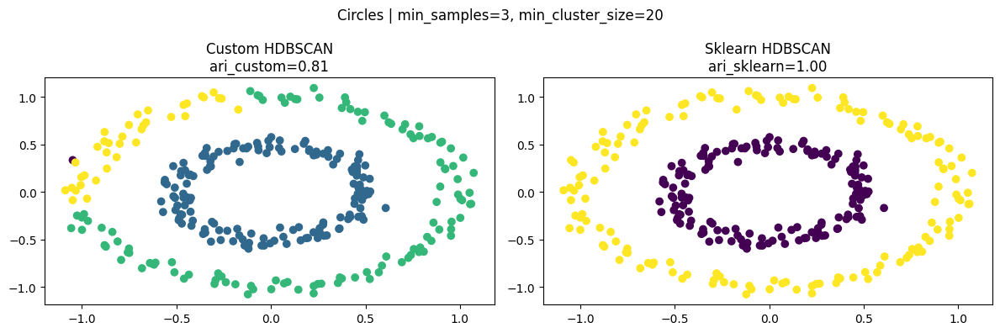

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


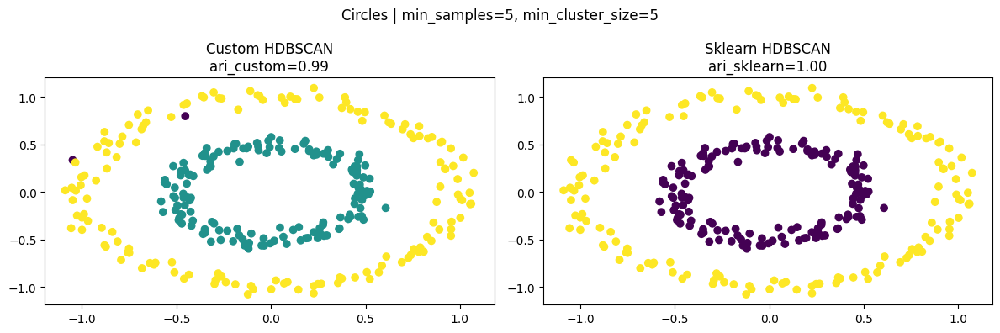

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


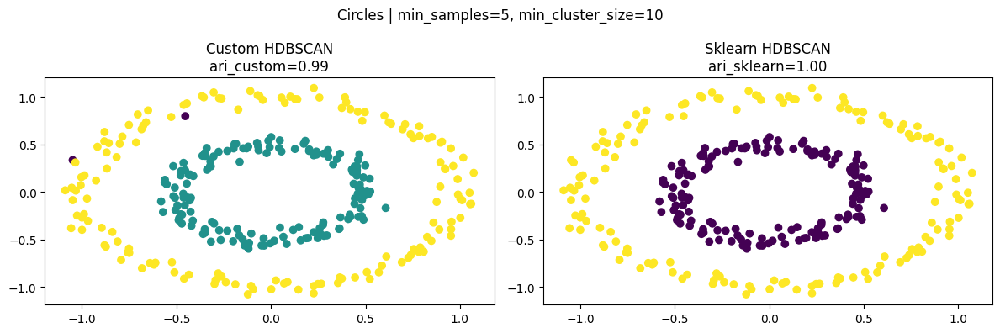

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


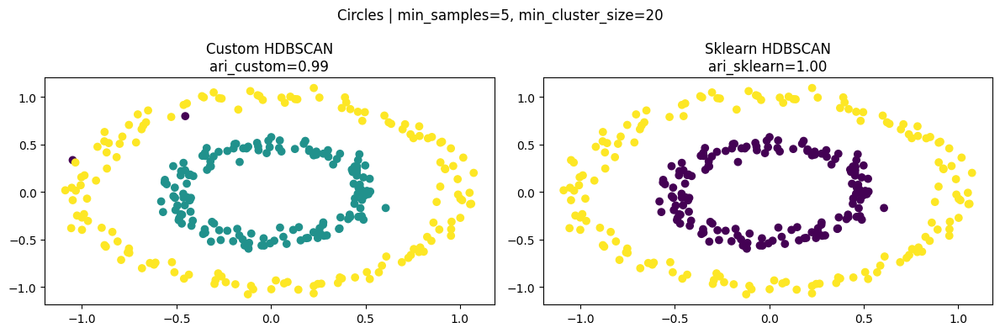

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


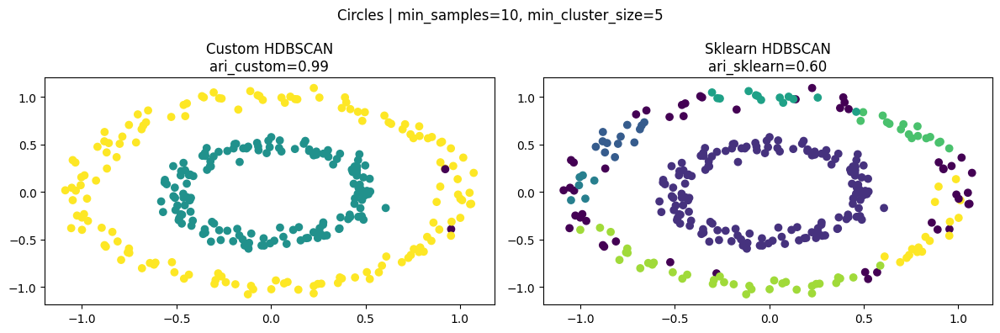

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


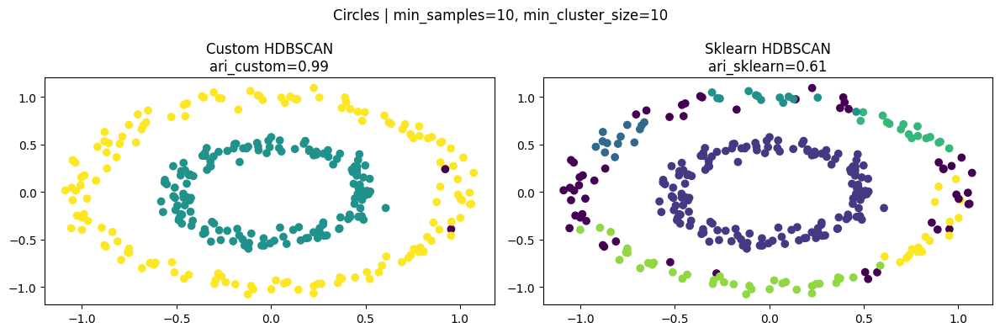

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


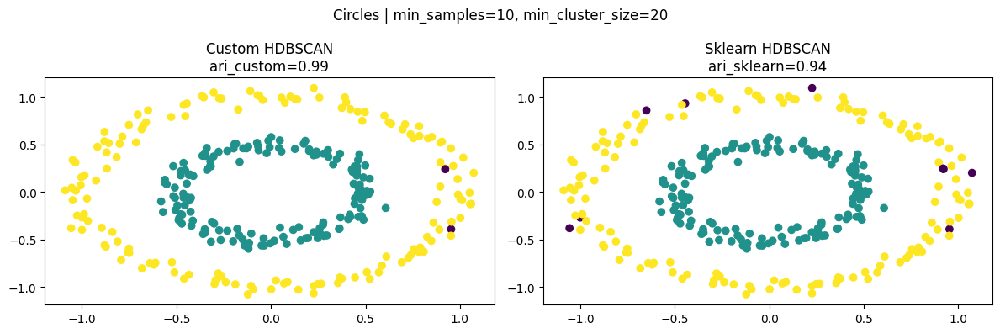

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


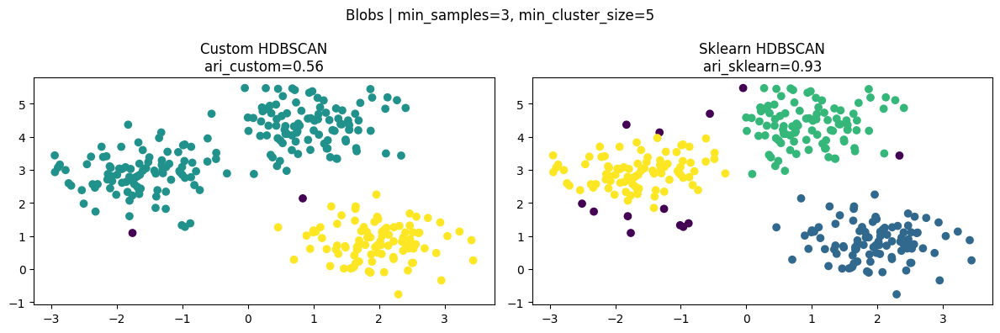

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


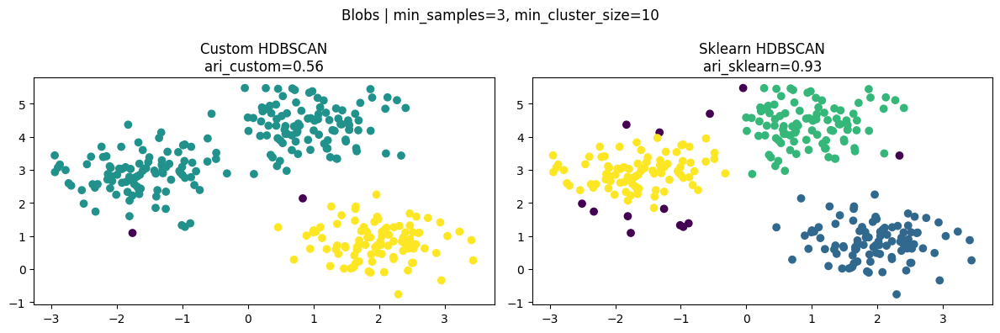

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


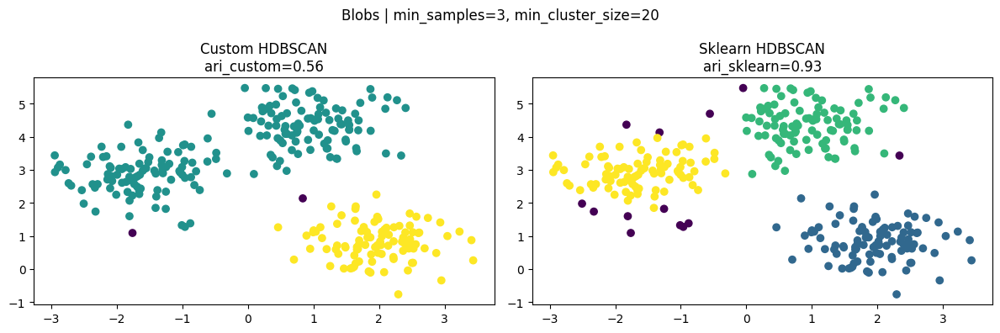

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


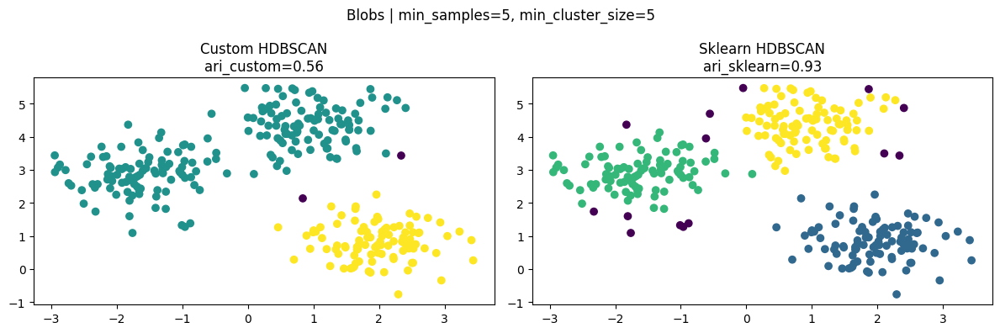

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


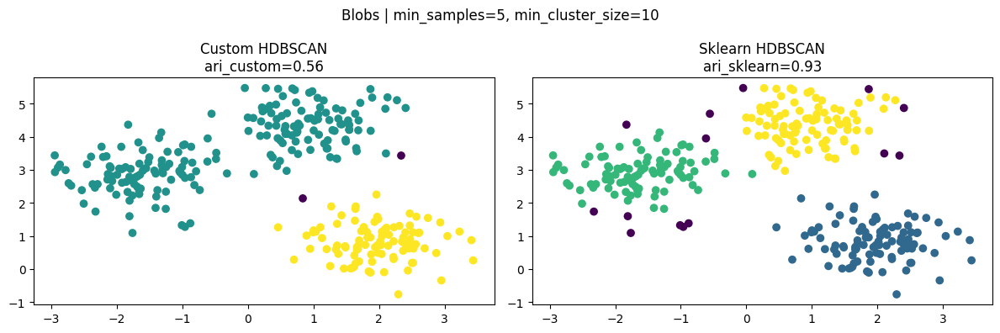

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


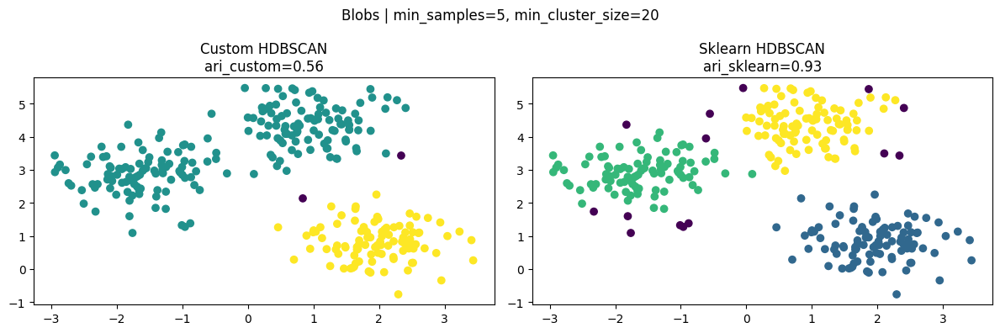

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


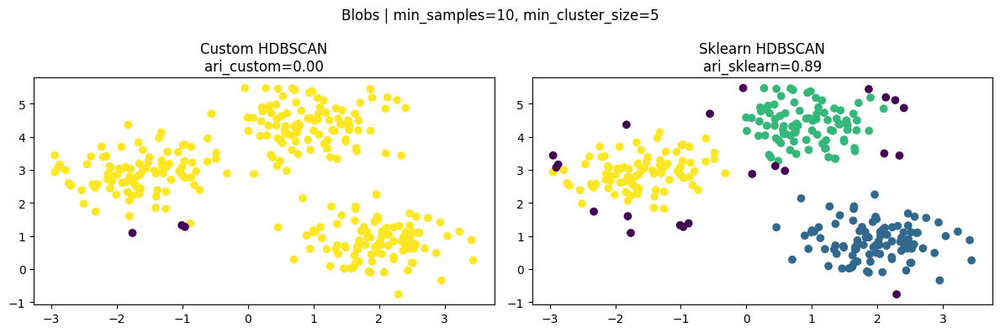

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


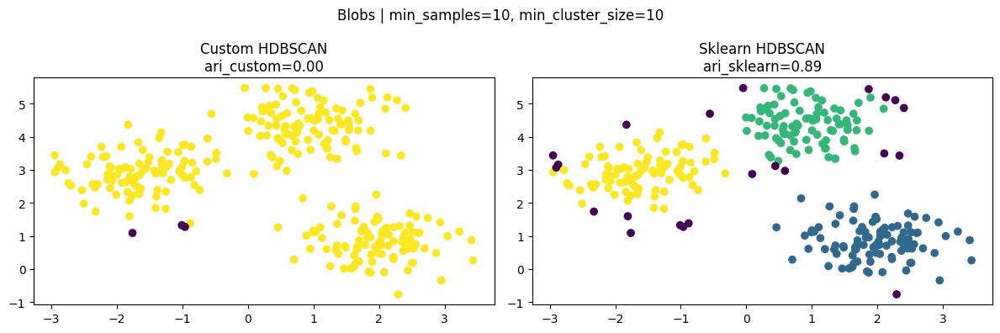

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


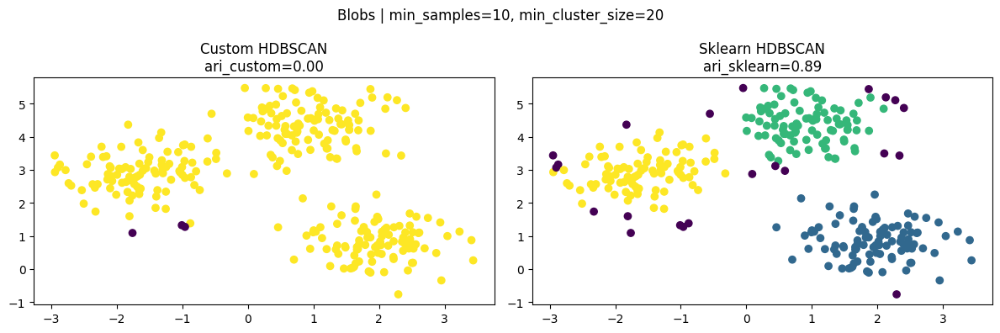

In [146]:
#tesing for different min_samples and min-custer_size

datasets = {
    'Moons': make_moons(n_samples=300, noise=0.05, random_state=0),
    'Circles': make_circles(n_samples=300, noise=0.05, factor=0.5, random_state=0),
    'Blobs': make_blobs(n_samples=300, centers=3, cluster_std=0.60, random_state=0)
}

min_samples_values = [3, 5, 10]
min_cluster_sizes = [5, 10, 20]

for name, (X, y_true) in datasets.items():
    for min_samples in min_samples_values:
        for min_cluster_size in min_cluster_sizes:
            # Custom HDBSCAN
            custom_model = CustomHDBSCAN(min_samples=min_samples, min_cluster_size=min_cluster_size)
            custom_model.fit(X)
            labels_custom = custom_model.labels_
            ari_custom = adjusted_rand_score(y_true, labels_custom)

            # Sklearn HDBSCAN
            sklearn_model = hdbscan.HDBSCAN(min_samples=min_samples, min_cluster_size=min_cluster_size)
            labels_sklearn = sklearn_model.fit_predict(X)
            ari_sklearn = adjusted_rand_score(y_true, labels_sklearn)

            # Plotting
            fig, axes = plt.subplots(1, 2, figsize=(12, 4))
            axes[0].scatter(X[:, 0], X[:, 1], c=labels_custom, cmap='viridis')
            axes[0].set_title(f'Custom HDBSCAN\n{ari_custom=:.2f}')

            axes[1].scatter(X[:, 0], X[:, 1], c=labels_sklearn, cmap='viridis')
            axes[1].set_title(f'Sklearn HDBSCAN\n{ari_sklearn=:.2f}')

            fig.suptitle(f'{name} | min_samples={min_samples}, min_cluster_size={min_cluster_size}')
            plt.tight_layout()
            plt.show()


/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


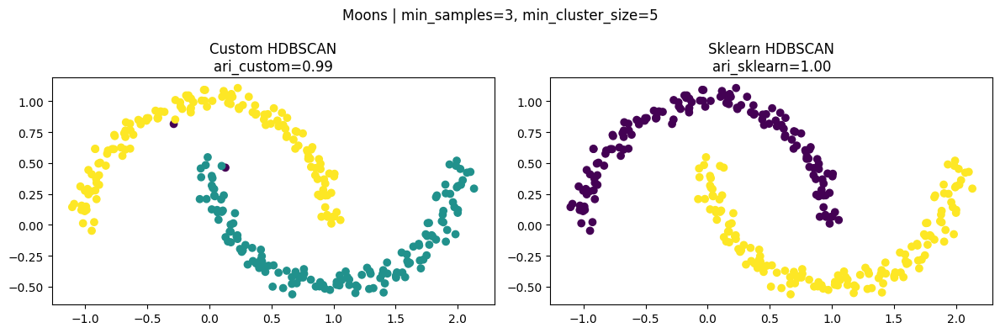

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


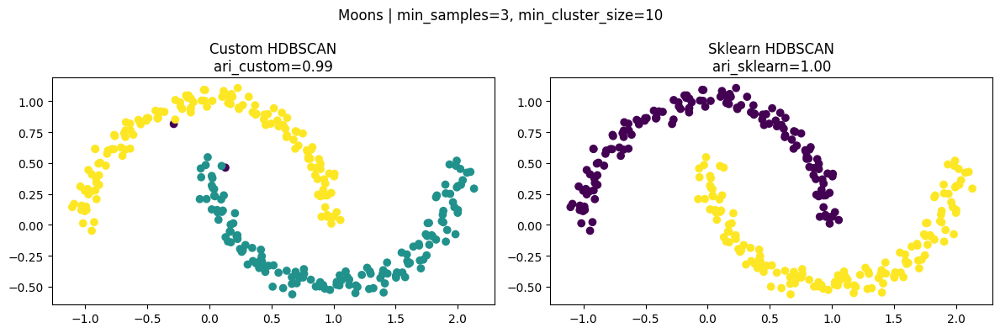

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


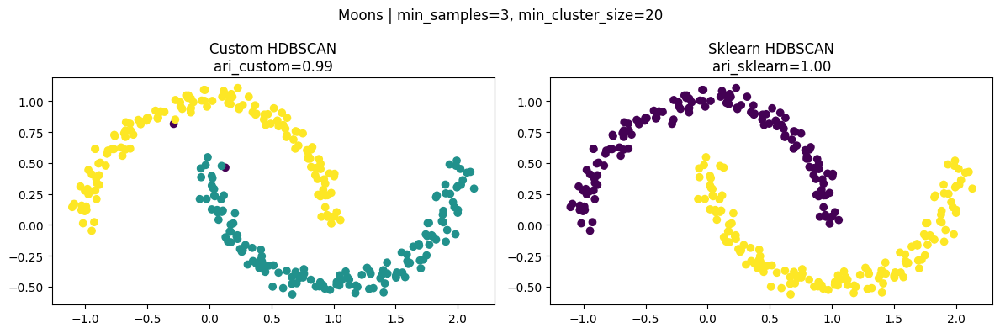

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


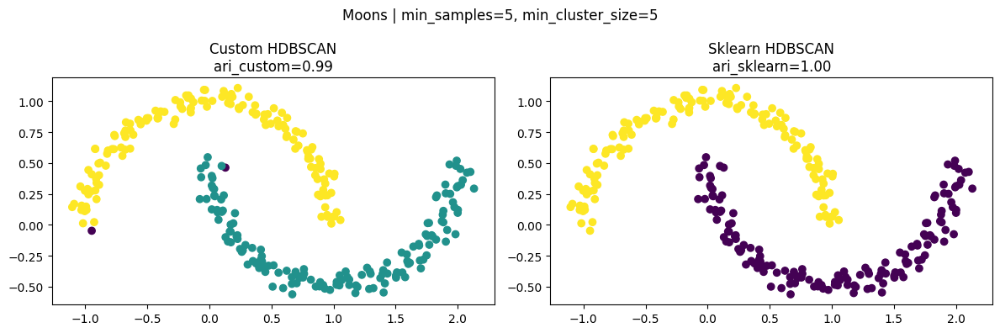

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


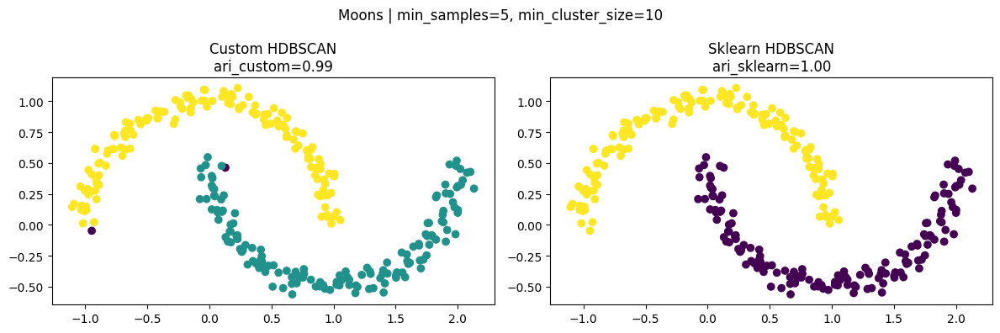

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


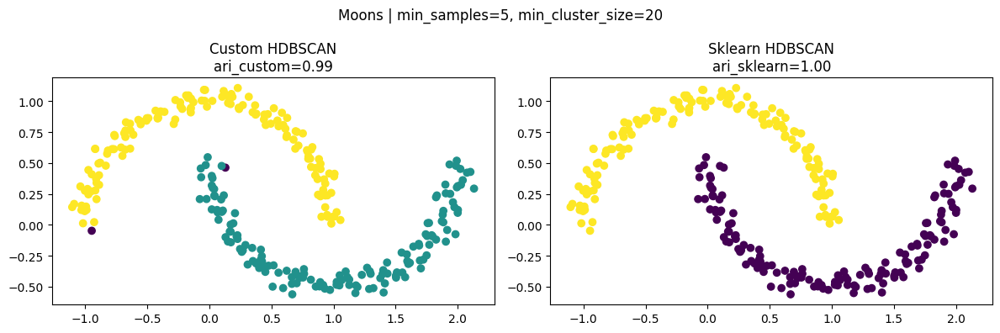

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


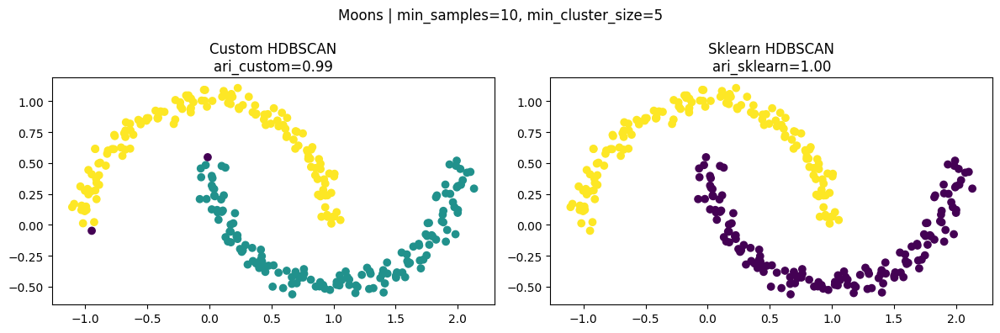

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


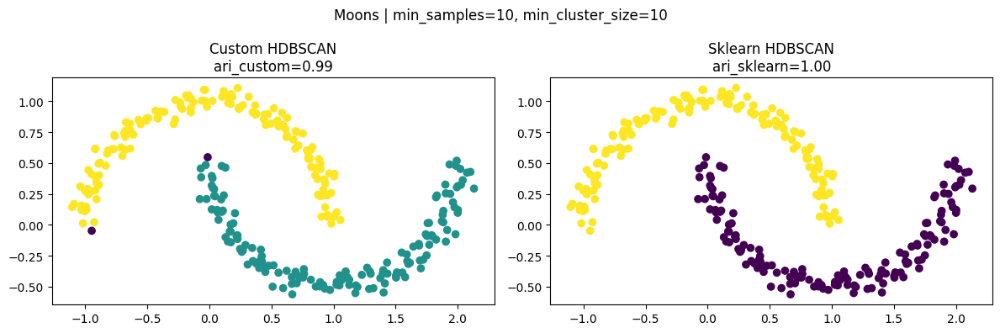

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


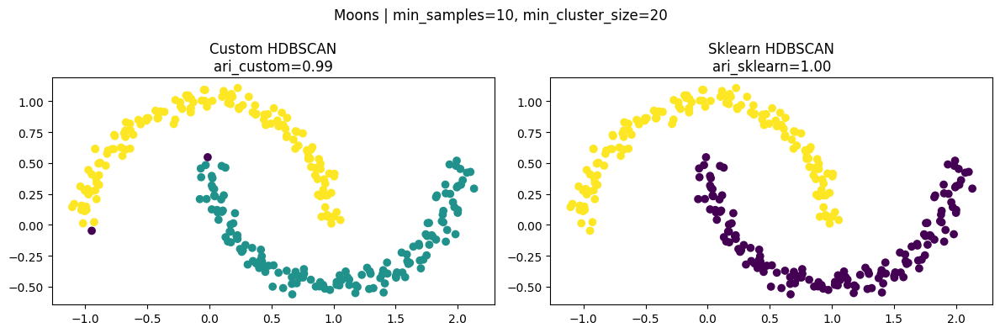

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


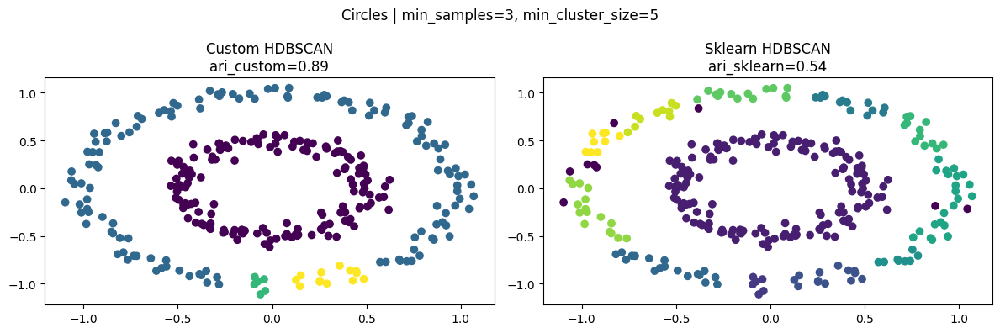

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


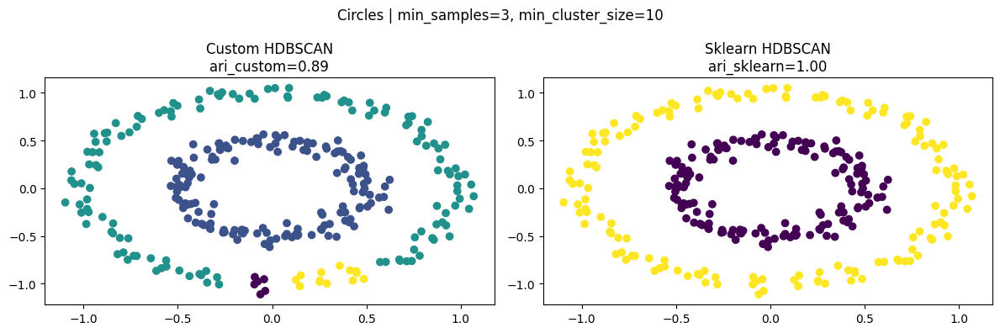

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


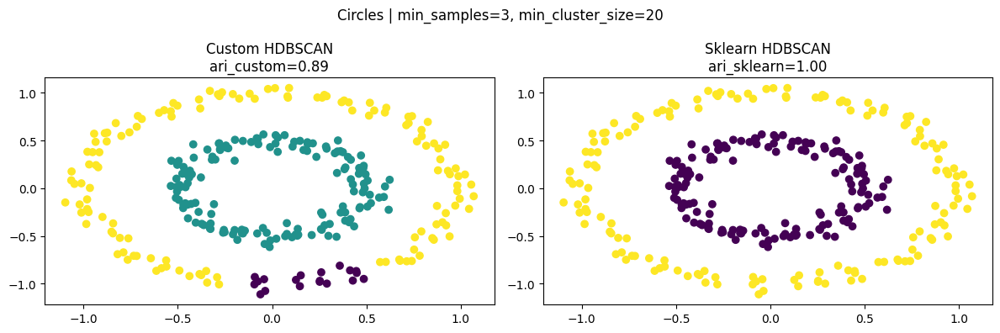

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


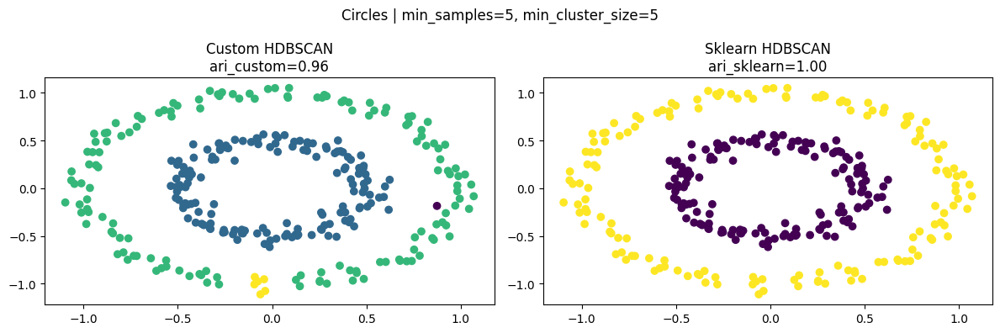

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


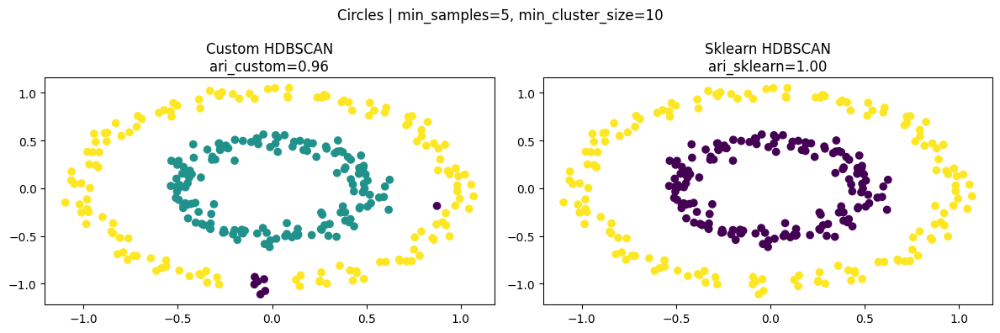

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


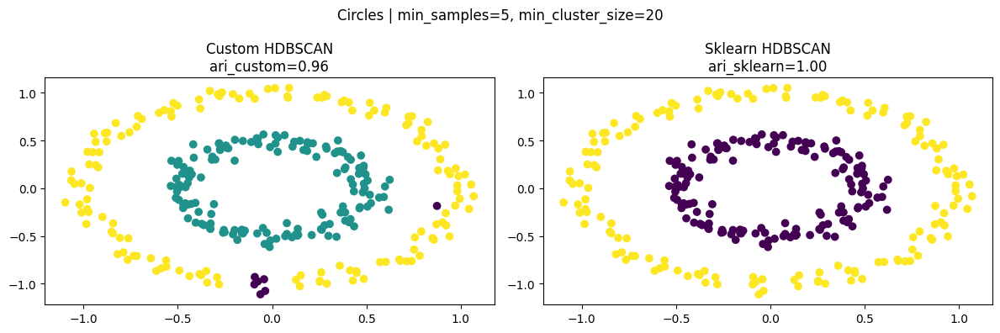

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


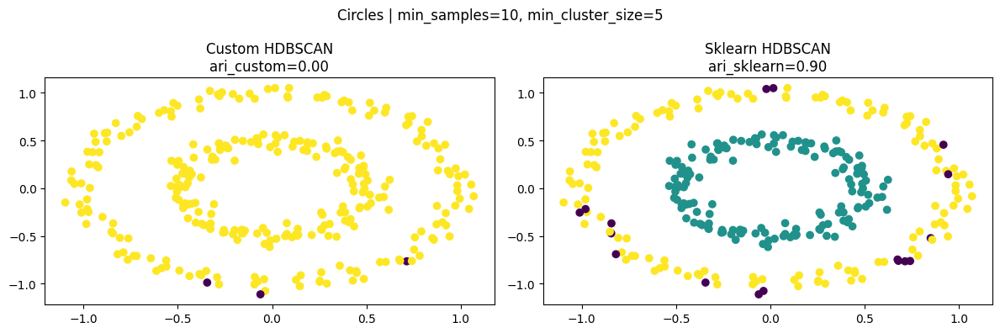

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


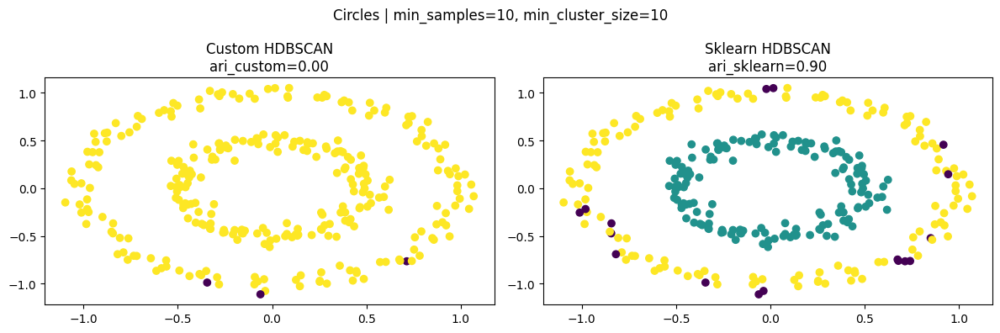

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


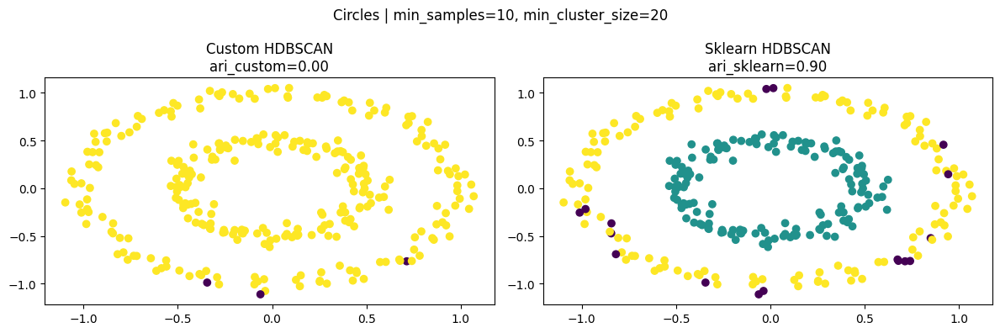

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


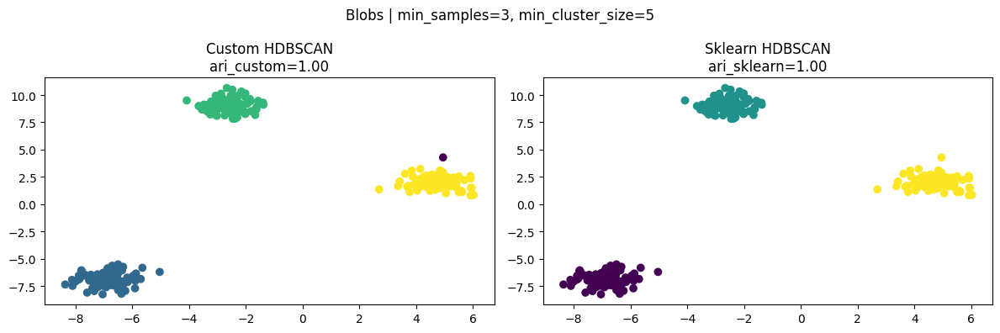

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


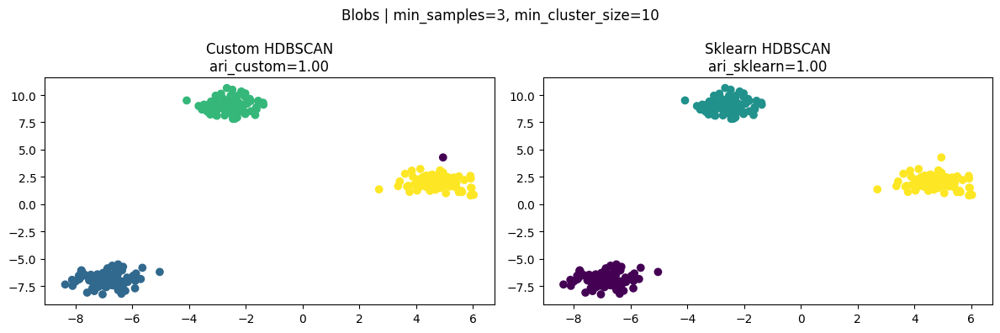

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


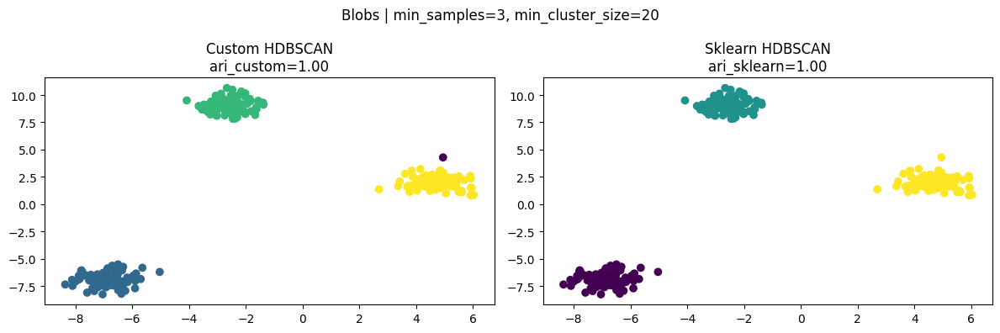

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


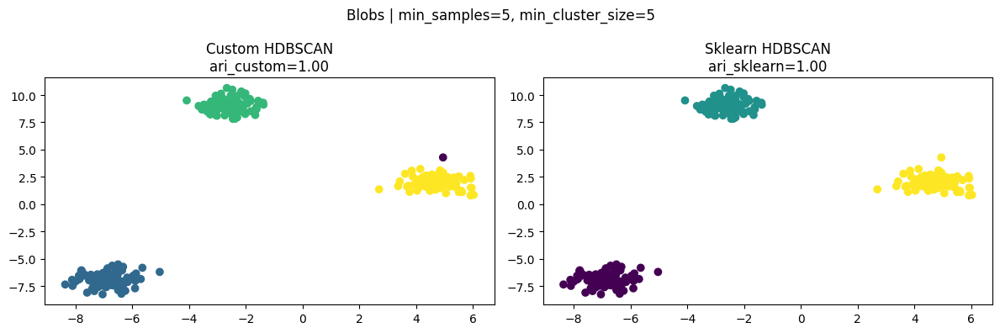

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


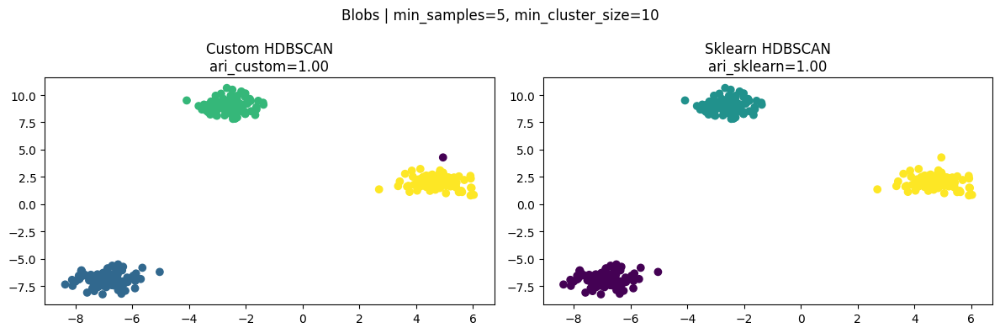

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


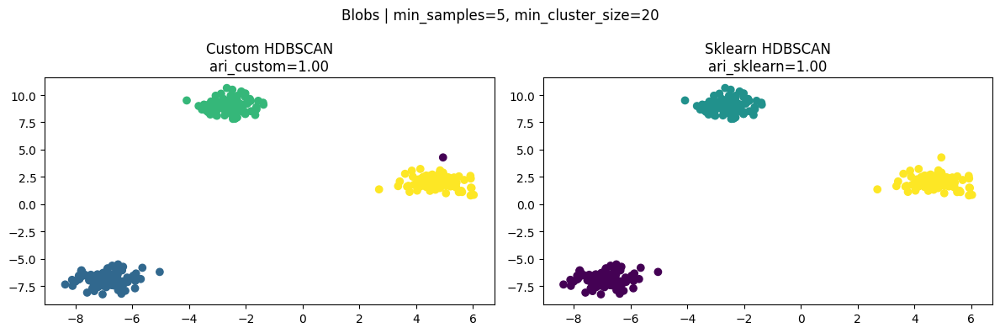

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


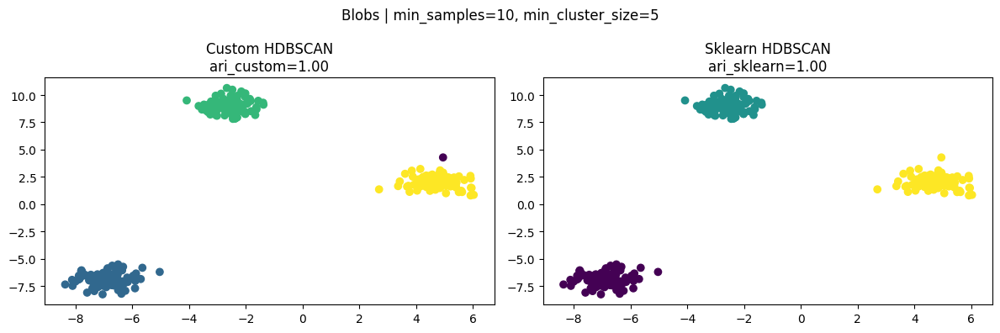

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


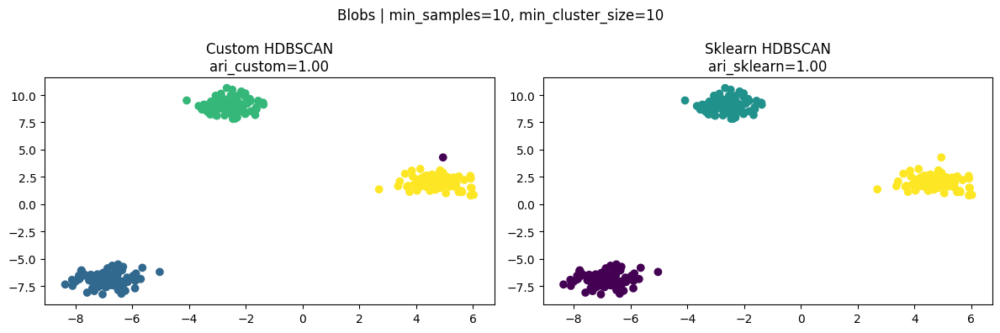

/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kevinpuga/Desktop/spring 25 utd/ML/code/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


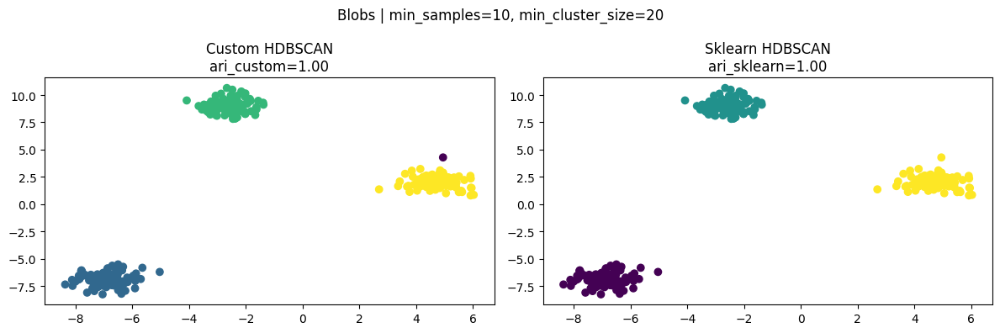

In [147]:
#tesing for different min_samples and min-custer_size

datasets = {
    'Moons': make_moons(n_samples=300, noise=0.05, random_state=42),
    'Circles': make_circles(n_samples=300, noise=0.05, factor=0.5, random_state=42),
    'Blobs': make_blobs(n_samples=300, centers=3, cluster_std=0.60, random_state=42)
}

min_samples_values = [3, 5, 10]
min_cluster_sizes = [5, 10, 20]

for name, (X, y_true) in datasets.items():
    for min_samples in min_samples_values:
        for min_cluster_size in min_cluster_sizes:
            # Custom HDBSCAN
            custom_model = CustomHDBSCAN(min_samples=min_samples, min_cluster_size=min_cluster_size)
            custom_model.fit(X)
            labels_custom = custom_model.labels_
            ari_custom = adjusted_rand_score(y_true, labels_custom)

            # Sklearn HDBSCAN
            sklearn_model = hdbscan.HDBSCAN(min_samples=min_samples, min_cluster_size=min_cluster_size)
            labels_sklearn = sklearn_model.fit_predict(X)
            ari_sklearn = adjusted_rand_score(y_true, labels_sklearn)

            # Plotting
            fig, axes = plt.subplots(1, 2, figsize=(12, 4))
            axes[0].scatter(X[:, 0], X[:, 1], c=labels_custom, cmap='viridis')
            axes[0].set_title(f'Custom HDBSCAN\n{ari_custom=:.2f}')

            axes[1].scatter(X[:, 0], X[:, 1], c=labels_sklearn, cmap='viridis')
            axes[1].set_title(f'Sklearn HDBSCAN\n{ari_sklearn=:.2f}')

            fig.suptitle(f'{name} | min_samples={min_samples}, min_cluster_size={min_cluster_size}')
            plt.tight_layout()
            plt.show()
